# INTRO

Smoking harms nearly every organ, causes numerous diseases, and reduces life expectancy. By 2030, smoking-related deaths are expected to reach 10 million globally. Despite evidence-based treatments for smoking cessation, fewer than one-third achieve abstinence. Physicians often find counseling ineffective. Factors such as nicotine dependence, exhaled CO, and emotional distress have been proposed to predict smoking cessation success, but individual use of these factors can lead to conflicting results. Machine learning-based prediction models may offer a better way to assess an individual's likelihood of quitting.

A group of scientists are working on predictive models with smoking status as the prediction target.My task is to help them create a machine learning model to identify the smoking status of an individual using bio-signals

# Dataset Description

**Columns in the Dataset:**
* age: Age in 5-year intervals
* height (cm): Height in centimeters.
* weight (kg): Weight in kilograms.
* waist (cm): Waist circumference, an important indicator for abdominal obesity.
* eyesight (left): Vision of the left eye
* eyesight (right): Vision of the right eye.
* hearing (left): Hearing ability in the left ear
* hearing (right): Hearing ability in the right ear.
* systolic: Systolic blood pressure (the upper number in a blood pressure reading, reflecting heart contraction pressure).
* relaxation: Diastolic blood pressure (the lower number, reflecting heart relaxation pressure).
* fasting blood sugar: Blood sugar level after fasting (usually a key metric for diabetes risk).
* cholesterol: Total cholesterol level, often measured in mg/dL.
* triglyceride: Type of fat in the blood, also measured in mg/dL.
* HDL: High-density lipoprotein (good cholesterol).
* LDL: Low-density lipoprotein (bad cholesterol).
* hemoglobin: Level of hemoglobin in the blood, a key indicator for anemia.
* urine protein: Presence of protein in urine (can indicate kidney function issues).
* serum creatinine: Measure of kidney function through creatinine levels in the blood.
* AST: Aspartate aminotransferase, an enzyme linked to liver function.
* ALT: Alanine aminotransferase, another enzyme related to liver health.
* GTP: Gamma-glutamyl transferase (γ-GTP), another liver enzyme.
* dental caries: Possibly a binary value indicating the presence/absence of dental caries (cavities).
* smoking: Likely a binary or categorical variable indicating smoking status (e.g., smoker/non-smoker).

# Data Overveiw

> Below is a brief overview and summary statistics of the data.

> * https://www.kaggle.com/competitions/playground-series-s3e24/overview

# Import Libraries

In [ ]:
# Data manipulation libraries
import pandas as pd
import numpy as np

# Data visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go

# Machine learning libraries
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV
from sklearn.linear_model import LinearRegression ,  Ridge, Lasso, ElasticNet, BayesianRidge, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, classification_report, roc_auc_score, f1_score, confusion_matrix, ConfusionMatrixDisplay,  make_scorer
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.cluster import KMeans, DBSCAN
from xgboost import XGBClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from collections import Counter
from scipy import stats

 # Load and Check Data

In [ ]:
df = pd.read_csv('train_dataset.csv')
df_test = pd.read_csv('test_dataset.csv')

In [ ]:
df.head()

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,35,170,85,97.0,0.9,0.9,1,1,118,78,...,70,142,19.8,1,1.0,61,115,125,1,1
1,20,175,110,110.0,0.7,0.9,1,1,119,79,...,71,114,15.9,1,1.1,19,25,30,1,0
2,45,155,65,86.0,0.9,0.9,1,1,110,80,...,57,112,13.7,3,0.6,1090,1400,276,0,0
3,45,165,80,94.0,0.8,0.7,1,1,158,88,...,46,91,16.9,1,0.9,32,36,36,0,0
4,20,165,60,81.0,1.5,0.1,1,1,109,64,...,47,92,14.9,1,1.2,26,28,15,0,0


In [ ]:
print('The dimension of the train dataset is:', df.shape)
print('The dimension of the test dataset is:', df_test.shape)

The dimension of the train dataset is: (38984, 23)
The dimension of the test dataset is: (16708, 22)


**Drop the 'id' column from both train and test**

In [ ]:
# df = df.drop(columns=['id'])
# df_test = df_test.drop(columns=['id'])

In [ ]:
df.describe().T\
    .style.bar(subset=['mean'], color=px.colors.qualitative.G10[2])\
    .background_gradient(subset=['std'], cmap='Blues')\
    .background_gradient(subset=['50%'], cmap='BuGn')

,count,mean,std,min,25%,50%,75%,max
age,38984.000000,44.127591,12.063564,20.000000,40.000000,40.000000,55.000000,85.000000
height(cm),38984.000000,164.689488,9.187507,130.000000,160.000000,165.000000,170.000000,190.000000
weight(kg),38984.000000,65.938718,12.896581,30.000000,55.000000,65.000000,75.000000,135.000000
waist(cm),38984.000000,82.062115,9.326798,51.000000,76.000000,82.000000,88.000000,129.000000
eyesight(left),38984.000000,1.014955,0.498527,0.100000,0.800000,1.000000,1.200000,9.900000
eyesight(right),38984.000000,1.008768,0.493813,0.100000,0.800000,1.000000,1.200000,9.900000
hearing(left),38984.000000,1.025369,0.157246,1.000000,1.000000,1.000000,1.000000,2.000000
hearing(right),38984.000000,1.026190,0.159703,1.000000,1.000000,1.000000,1.000000,2.000000
systolic,38984.000000,121.475631,13.643521,71.000000,112.000000,120.000000,130.000000,233.000000
relaxation,38984.000000,75.994408,9.658734,40.000000,70.000000,76.000000,82.000000,146.000000


**Some observations:**

1. **Age Distribution**: The average age is 44, with most individuals between 40-55 years old. The range spans from 20 to 85, indicating a broad age demographic.
   
2. **Physical Attributes**:
   - Average height is approximately 165 cm, and average weight is 67 kg.
   - Waist circumference averages 83 cm, with most individuals between 77 and 89 cm.

3. **Health Metrics**:
   - **Blood Pressure**: Average systolic pressure is around 122 mmHg, while relaxation (diastolic) averages 76 mmHg, which falls in the normal range.
   - **Cholesterol**: The mean cholesterol is 195, which is near the upper end of the normal range (under 200).
   - **Triglycerides** and **LDL** show large variability, indicating potential outliers or higher risk individuals.

4. **Smoking**: About 44% of individuals are smokers (mean of 0.44), indicating a significant portion of the population smokes.

5. **Hearing and Eyesight**: The majority of participants have normal hearing (mean ~1), but eyesight shows some variability, with a maximum value of 9.9, possibly indicating extreme cases.

6. **Biomarkers**: There is significant variability in liver-related enzymes (AST, ALT, GTP), suggesting a few individuals may have liver function abnormalities.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38984 entries, 0 to 38983
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  38984 non-null  int64  
 1   height(cm)           38984 non-null  int64  
 2   weight(kg)           38984 non-null  int64  
 3   waist(cm)            38984 non-null  float64
 4   eyesight(left)       38984 non-null  float64
 5   eyesight(right)      38984 non-null  float64
 6   hearing(left)        38984 non-null  int64  
 7   hearing(right)       38984 non-null  int64  
 8   systolic             38984 non-null  int64  
 9   relaxation           38984 non-null  int64  
 10  fasting blood sugar  38984 non-null  int64  
 11  Cholesterol          38984 non-null  int64  
 12  triglyceride         38984 non-null  int64  
 13  HDL                  38984 non-null  int64  
 14  LDL                  38984 non-null  int64  
 15  hemoglobin           38984 non-null 

## Check for missing data:

In [ ]:
print(df.isna().sum())
print(df_test.isna().sum())

age                    0
height(cm)             0
weight(kg)             0
waist(cm)              0
eyesight(left)         0
eyesight(right)        0
hearing(left)          0
hearing(right)         0
systolic               0
relaxation             0
fasting blood sugar    0
Cholesterol            0
triglyceride           0
HDL                    0
LDL                    0
hemoglobin             0
Urine protein          0
serum creatinine       0
AST                    0
ALT                    0
Gtp                    0
dental caries          0
smoking                0
dtype: int64
age                    0
height(cm)             0
weight(kg)             0
waist(cm)              0
eyesight(left)         0
eyesight(right)        0
hearing(left)          0
hearing(right)         0
systolic               0
relaxation             0
fasting blood sugar    0
Cholesterol            0
triglyceride           0
HDL                    0
LDL                    0
hemoglobin             0
Urine protei

> There are no missing values in the dataset. That is good.

In [ ]:
df.nunique().sort_values()

,0
smoking,2
dental caries,2
hearing(right),2
hearing(left),2
Urine protein,6
height(cm),13
age,14
eyesight(right),17
eyesight(left),19
weight(kg),22


hearing(left), hearing(right), Urine protein, dental caries can be one hot encoded

In [ ]:
num_cols = [column for column in df.columns if df[column].nunique() > 10]

cat_cols = [column for column in df.columns if df[column].nunique() <= 10]

print(f"Observations: {df.shape[0]}")
print(f"Variables: {df.shape[1]}")
print(f"Categorical columns: {len(cat_cols)}")
print(cat_cols)
print(f"Numerical columns: {len(num_cols)}")
print(num_cols)

Observations: 38984
Variables: 23
Categorical columns: 5
['hearing(left)', 'hearing(right)', 'Urine protein', 'dental caries', 'smoking']
Numerical columns: 18
['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'serum creatinine', 'AST', 'ALT', 'Gtp']


## check for outliers

In [ ]:
# Function to detect outliers in a column
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers


# Detect outliers in each numerical column and store results
outliers_info = {}

for col in df.select_dtypes(include="number").columns:
    outliers = detect_outliers(df, col)
    if not outliers.empty:
        outliers_info[col] = len(outliers)
        print(f"Column '{col}' has {len(outliers)} outliers.")

Column 'age' has 211 outliers.
Column 'height(cm)' has 177 outliers.
Column 'weight(kg)' has 146 outliers.
Column 'waist(cm)' has 377 outliers.
Column 'eyesight(left)' has 921 outliers.
Column 'eyesight(right)' has 950 outliers.
Column 'hearing(left)' has 989 outliers.
Column 'hearing(right)' has 1021 outliers.
Column 'systolic' has 465 outliers.
Column 'relaxation' has 498 outliers.
Column 'fasting blood sugar' has 2316 outliers.
Column 'Cholesterol' has 512 outliers.
Column 'triglyceride' has 1607 outliers.
Column 'HDL' has 707 outliers.
Column 'LDL' has 441 outliers.
Column 'hemoglobin' has 484 outliers.
Column 'Urine protein' has 2148 outliers.
Column 'serum creatinine' has 2189 outliers.
Column 'AST' has 2111 outliers.
Column 'ALT' has 2642 outliers.
Column 'Gtp' has 3375 outliers.
Column 'dental caries' has 8359 outliers.


In [ ]:
# Function to drop outliers in specific columns
def drop_outliers(df, columns):
    for column in columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

columns_to_remove_outliers = ['eyesight(left)', 'eyesight(right)', 'hearing(left)', 'hearing(right)']

# Drop the outliers
df_cleaned = drop_outliers(df, columns_to_remove_outliers)

# Check the shape of the cleaned dataframe
print(f"Shape of the dataframe before dropping outliers: {df.shape}")
print(f"Shape of the dataframe after dropping outliers: {df_cleaned.shape}")

Shape of the dataframe before dropping outliers: (38984, 23)
Shape of the dataframe after dropping outliers: (36048, 23)


# Exploratory Data Analysis

## Univariate Analysis

In [ ]:
# Count data for the 'Smoking' column
attrition_counts = df['smoking'].value_counts()

# Create subplots
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "bar"}, {"type": "pie"}]],
                    subplot_titles=("Countplot", "Percentages"))

# Bar plot
fig.add_trace(go.Bar(x=attrition_counts.index, y=attrition_counts.values,
                     text=attrition_counts.values, textposition='auto',
                     marker_color=['#91a7ff', '#5a5db0']), row=1, col=1)

# Pie chart
fig.add_trace(go.Pie(labels=attrition_counts.index, values=attrition_counts.values,
                     hole=0.4, marker_colors=['#91a7ff', '#5a5db0'],
                     textinfo='percent+label'), row=1, col=2)

# Update layout
fig.update_layout(title_text="Distribution of the Target Variable", showlegend=False,
                  paper_bgcolor='black', plot_bgcolor='black',
                  font=dict(color="white"))

fig.show()

The distribution of the smoking column shows that 63.3% of the individuals are non-smokers (0s), while 36.7% are smokers (1s). This indicates a class imbalance in the target variable, with more non-smokers than smokers.

In [ ]:
# Loop through each numerical column
for col in num_cols:
    # Create a subplot with one row and three columns
    fig = make_subplots(rows=1, cols=3, column_widths=[0.6, 0.2, 0.2],
                        subplot_titles=[f'{col} Distribution (Train & Test)', 'Quantiles (Train)', 'Quantiles (Test)'])

    # Add the histogram for train dataset
    fig.add_trace(go.Histogram(x=df[col], name=f'Train {col}', opacity=0.7,
                               marker=dict(color="#0A4D68", line=dict(color='#DBE6EC', width=0.5))),
                  row=1, col=1)

    # Add the histogram for test dataset
    fig.add_trace(go.Histogram(x=df_test[col], name=f'Test {col}', opacity=0.7,
                               marker=dict(color="#FF5733", line=dict(color='#DBE6EC', width=0.5))),
                  row=1, col=1)

    # Add the vertical boxplot for train dataset
    fig.add_trace(go.Box(y=df[col], name=f'Train {col}', orientation='v', boxpoints='outliers',
                         marker=dict(color='#9bf6ff')), row=1, col=2)

    # Add the vertical boxplot for test dataset
    fig.add_trace(go.Box(y=df_test[col], name=f'Test {col}', orientation='v', boxpoints='outliers',
                         marker=dict(color='#ffafcc')), row=1, col=3)

    # Update layout
    fig.update_layout(height=400, width=1000, showlegend=False,
                      paper_bgcolor='black', plot_bgcolor='black',
                      font=dict(color="white"),
                      barmode='overlay')

    # Show the figure
    fig.show()


* It seems that some variables have large skewness. For this case, we can perform log transformation on them.
* In general, the data distribution of the training and test sets is similar.




In [ ]:
def plot_categorical_distribution(df, categorical_cols):
    colors = ['#ffadad','#ffd6a5','#fdffb6','#caffbf','#9bf6ff','#a0c4ff']
    for col in categorical_cols:
        # Count data for the current column
        counts = df[col].value_counts()

        # Create subplots
        fig = make_subplots(rows=1, cols=2, specs=[[{"type": "bar"}, {"type": "pie"}]],
                            subplot_titles=(f"Countplot of {col}", f"Percentages of {col}"))

        # Bar plot
        fig.add_trace(go.Bar(x=counts.index, y=counts.values,
                             text=counts.values, textposition='auto',
                             marker_color=colors), row=1, col=1)

        # Pie chart
        fig.add_trace(go.Pie(labels=counts.index, values=counts.values,
                             hole=0.4, marker_colors=colors,
                             textinfo='percent+label'), row=1, col=2)

        # Update layout
        fig.update_layout(title_text=f"Distribution of {col}", showlegend=False,
                          paper_bgcolor='black', plot_bgcolor='black',
                          font=dict(color="white"))

        # Show the figure
        fig.show()

plot_categorical_distribution(df, cat_cols)

## Bivariate Analysis

### Numerical vs Numerical:

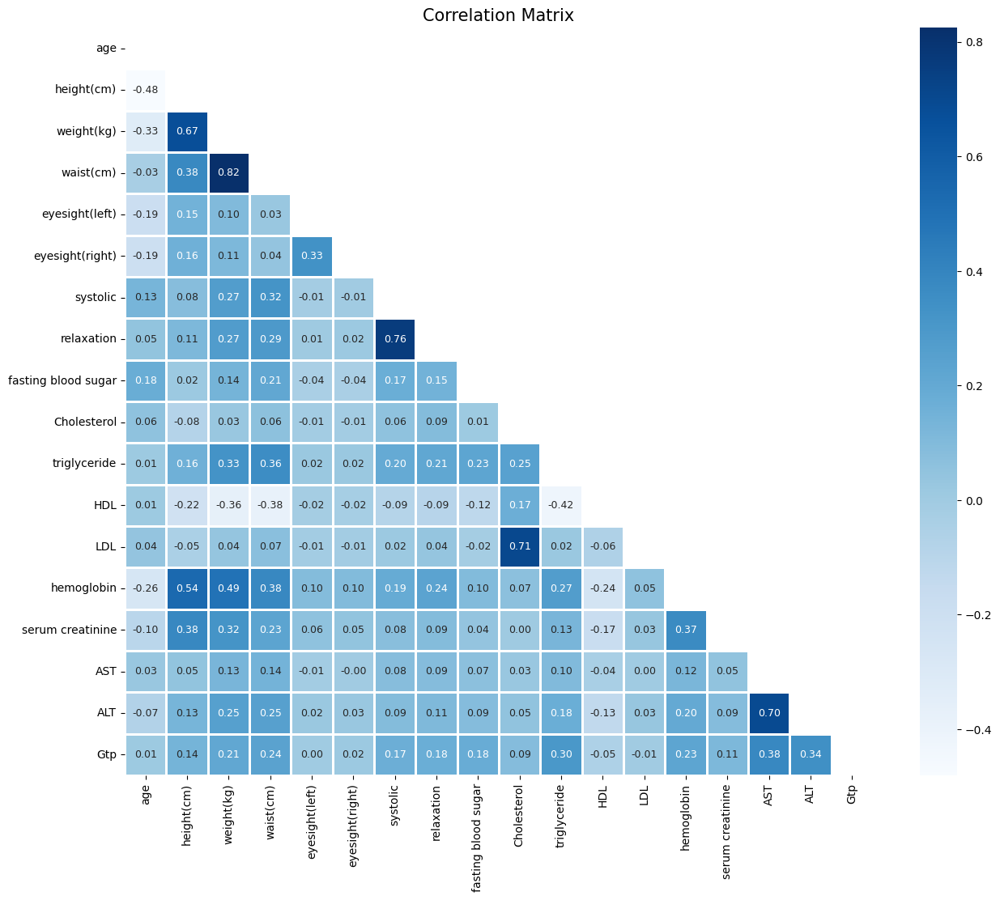

In [ ]:
corr_matrix = df[num_cols].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(15, 12))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='Blues', fmt='.2f', linewidths=1, square=True, annot_kws={"size": 9} )
plt.title('Correlation Matrix', fontsize=15)
plt.show()

* We don't have many highly correlated features in the total dataset.
* Some features are correlated, we can take a look later.
* Anyway, I didn't notice multicollinearity. This is a good thing.

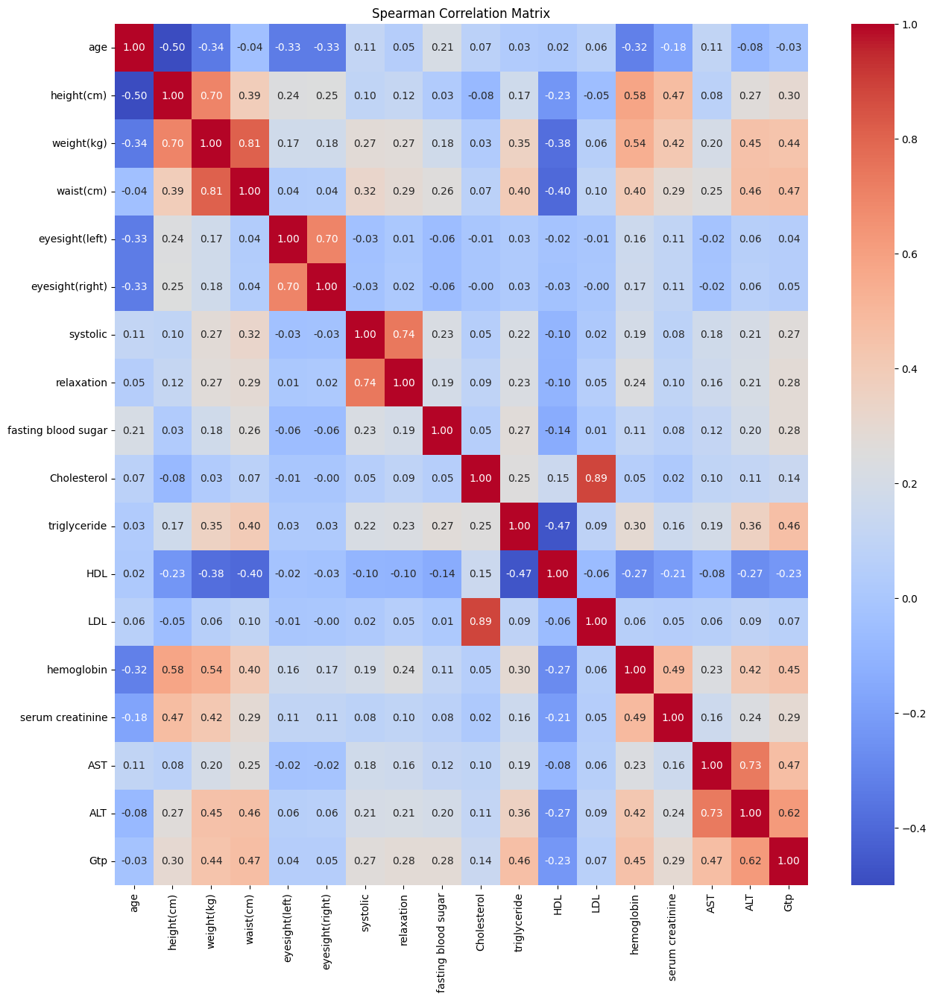

In [ ]:
# Calculate Spearman correlation matrix
spearman_corr = df[num_cols].corr(method='spearman')

# Visualize the Spearman correlation matrix
plt.figure(figsize=(15,15))
sns.heatmap(spearman_corr, annot=True, fmt=".2f", cmap="coolwarm", annot_kws={"size":10})
plt.title('Spearman Correlation Matrix')
plt.show()

The Spearman correlation coefficient is useful for detecting non-linear monotonic relationships.

LDL affects Chelestrol (0.89)


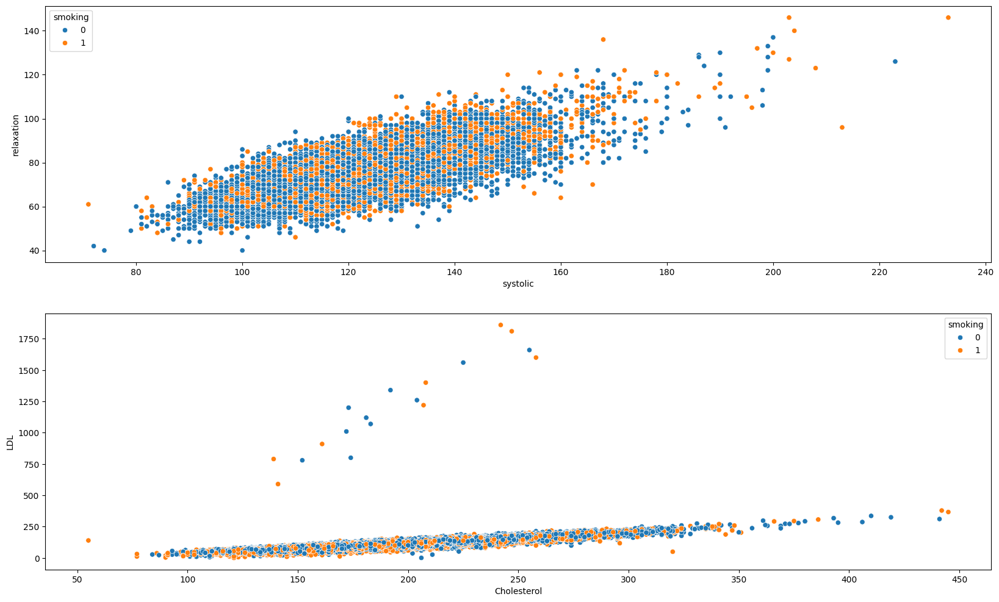

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(20, 12))

target = 'smoking'

sns.scatterplot(ax=axes[0], data=df, x='systolic', y='relaxation', hue=target)
sns.scatterplot(ax=axes[1], data=df, x='Cholesterol', y='LDL', hue=target)

plt.show()

### Categorical vs Numerical:

In [ ]:
pd.crosstab(df['smoking'], df['age'], normalize= 'columns')

age,20,25,30,35,40,45,50,55,60,65,70,75,80,85
smoking,,,,,,,,,,,,,,
0,0.491615,0.537617,0.521269,0.464104,0.63073,0.660938,0.658036,0.703564,0.727358,0.775862,0.808874,0.84434,0.883249,0.928571
1,0.508385,0.462383,0.478731,0.535896,0.36927,0.339062,0.341964,0.296436,0.272642,0.224138,0.191126,0.15566,0.116751,0.071429


* Younger Age Groups: In the age groups 20 the proportion of smokers is higher than non-smokers. This could suggest that smoking is more prevalent in younger age groups in dataset.

* Middle Age Groups: In the age groups 40 and 45, the proportion of non-smokers is higher than smokers. This trend reverses in the age group 45.

* Older Age Groups: Starting from age 49, the proportion of non-smokers is consistently higher than smokers, and this difference seems to increase with age. This could suggest that smoking is less common in older age groups in dataset.



In [ ]:
pd.crosstab(df['eyesight(left)'], df['smoking'], normalize = 'index')

smoking,0,1
eyesight(left),,
0.1,0.733871,0.266129
0.2,0.720635,0.279365
0.3,0.689655,0.310345
0.4,0.720930,0.279070
0.5,0.705163,0.294837
0.6,0.687113,0.312887
0.7,0.682285,0.317715
0.8,0.673066,0.326934
0.9,0.658591,0.341409


As eyesight improves (closer to 1.0), the percentage of smokers tends to increase. For instance, individuals with perfect eyesight (1.0) have a higher proportion of smokers (37.3%), whereas those with poorer eyesight (0.1–0.5) tend to have a lower proportion of smokers. This suggests a potential correlation between better eyesight and higher smoking rates, though the trend isn't perfectly linear.

In [ ]:
pd.crosstab(df['eyesight(right)'], df['smoking'], normalize = 'index')

smoking,0,1
eyesight(right),,
0.1,0.715909,0.284091
0.2,0.705882,0.294118
0.3,0.730835,0.269165
0.4,0.708645,0.291355
0.5,0.700654,0.299346
0.6,0.723955,0.276045
0.7,0.686288,0.313712
0.8,0.687332,0.312668
0.9,0.644794,0.355206


As eyesight improves (e.g., values close to 1.0), the proportion of smokers increases, with the highest smoking percentage (66.67%) for those with a right eyesight value of 1.6. Conversely, individuals with poorer eyesight (lower values) tend to have a higher proportion of non-smokers. This suggests a potential correlation between better eyesight and higher smoking rates.

In [ ]:
pd.crosstab(df['hearing(left)'], df['smoking'], normalize = 'index')

smoking,0,1
hearing(left),,
1,0.631004,0.368996
2,0.698686,0.301314


In [ ]:
pd.crosstab(df['hearing(right)'], df['smoking'], normalize = 'index')

smoking,0,1
hearing(right),,
1,0.631220,0.368780
2,0.688541,0.311459


From the above, these are a couple of observations;

* When hearing = 1 about 63% are non-smokers (regardless right or left).
* When hearing = 2 about 68% are non-smokers (regardless right or left)

<ipython-input-24-73b17c36898f>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




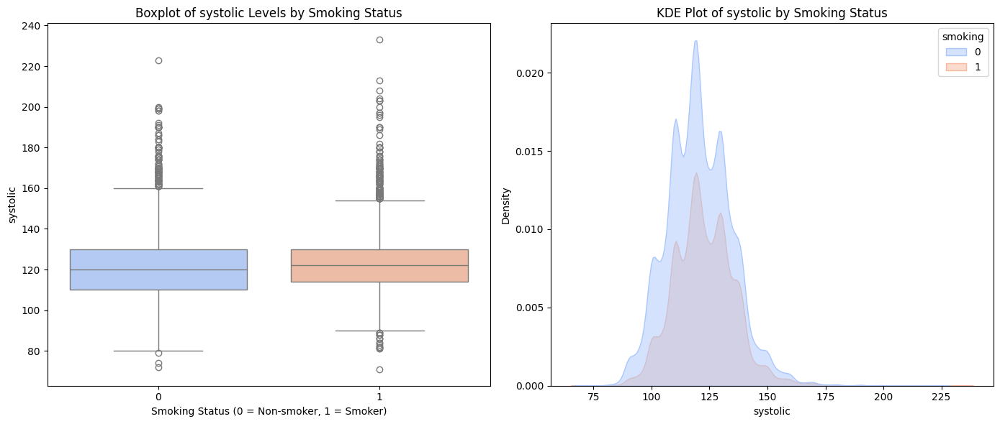

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# 1. Boxplot
sns.boxplot(x='smoking', y='systolic', data=df, palette='coolwarm', ax=axes[0])
axes[0].set_title('Boxplot of systolic Levels by Smoking Status')
axes[0].set_xlabel('Smoking Status (0 = Non-smoker, 1 = Smoker)')
axes[0].set_ylabel('systolic')

# 2. KDE Plot
sns.kdeplot(data=df, x='systolic', hue='smoking', fill=True, palette='coolwarm', alpha=0.5, ax=axes[1])
axes[1].set_title('KDE Plot of systolic by Smoking Status')
axes[1].set_xlabel('systolic')
axes[1].set_ylabel('Density')

plt.tight_layout()
plt.show()

The systolic distributions of non-smokers and smokers are very similar. Next, we explore the relationship between relaxation and smoking.

<ipython-input-25-dcca33dd5ef1>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




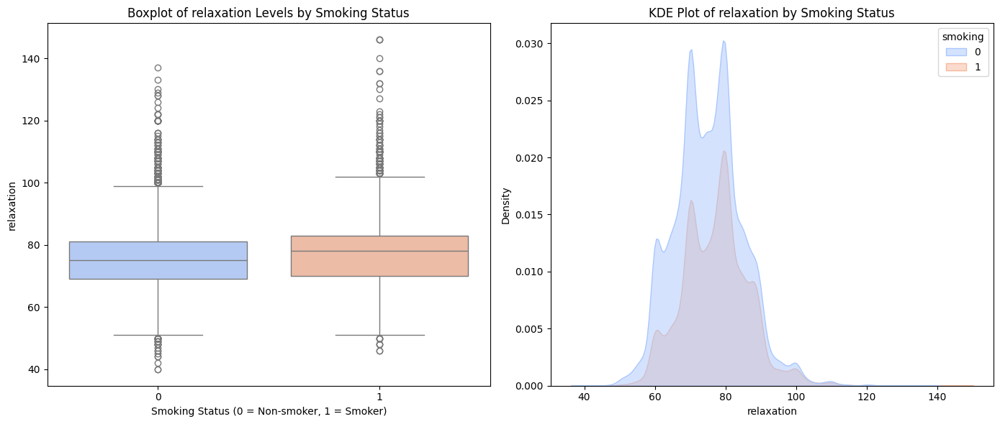

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# 1. Boxplot
sns.boxplot(x='smoking', y='relaxation', data=df, palette='coolwarm', ax=axes[0])
axes[0].set_title('Boxplot of relaxation Levels by Smoking Status')
axes[0].set_xlabel('Smoking Status (0 = Non-smoker, 1 = Smoker)')
axes[0].set_ylabel('relaxation')

# 2. KDE Plot
sns.kdeplot(data=df, x='relaxation', hue='smoking', fill=True, palette='coolwarm', alpha=0.5, ax=axes[1])
axes[1].set_title('KDE Plot of relaxation by Smoking Status')
axes[1].set_xlabel('relaxation')
axes[1].set_ylabel('Density')

plt.tight_layout()
plt.show()

The relaxation distributions of non-smokers and smokers are very similar. Next, we explore the relationship between fasting blood sugar and smoking.

<ipython-input-26-9d0fc52a8291>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




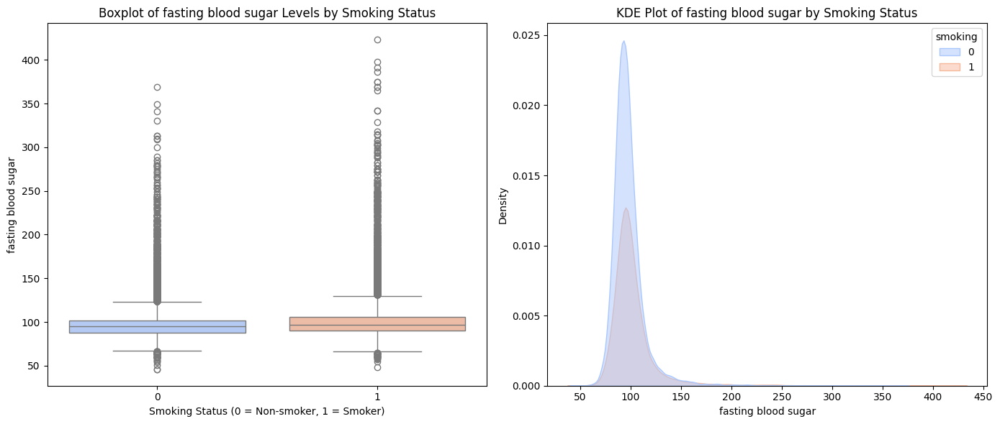

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# 1. Boxplot
sns.boxplot(x='smoking', y='fasting blood sugar', data=df, palette='coolwarm', ax=axes[0])
axes[0].set_title('Boxplot of fasting blood sugar Levels by Smoking Status')
axes[0].set_xlabel('Smoking Status (0 = Non-smoker, 1 = Smoker)')
axes[0].set_ylabel('fasting blood sugar')

# 2. KDE Plot
sns.kdeplot(data=df, x='fasting blood sugar', hue='smoking', fill=True, palette='coolwarm', alpha=0.5, ax=axes[1])
axes[1].set_title('KDE Plot of fasting blood sugar by Smoking Status')
axes[1].set_xlabel('fasting blood sugar')
axes[1].set_ylabel('Density')

plt.tight_layout()
plt.show()

The fasting blood sugar distributions of non-smokers and smokers are very similar. Next, we explore the relationship between Cholesterol and smoking.

<ipython-input-27-74a5aaea734d>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




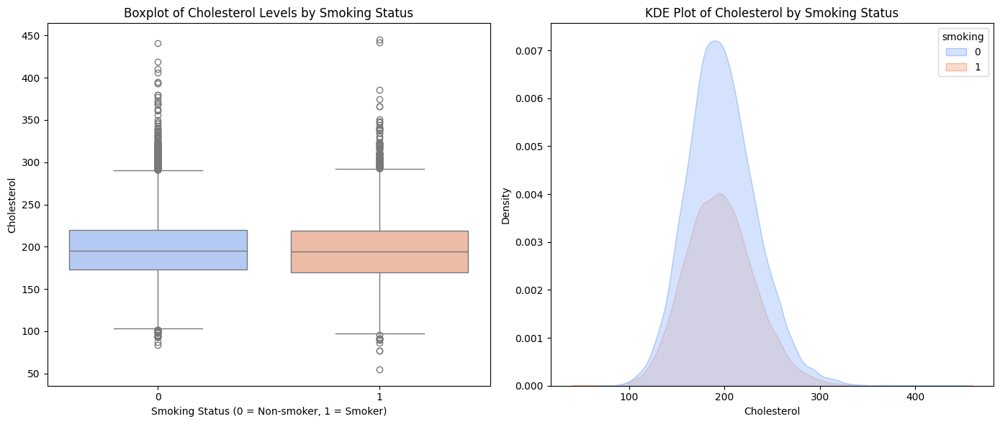

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# 1. Boxplot
sns.boxplot(x='smoking', y='Cholesterol', data=df, palette='coolwarm', ax=axes[0])
axes[0].set_title('Boxplot of Cholesterol Levels by Smoking Status')
axes[0].set_xlabel('Smoking Status (0 = Non-smoker, 1 = Smoker)')
axes[0].set_ylabel('Cholesterol')

# 2. KDE Plot
sns.kdeplot(data=df, x='Cholesterol', hue='smoking', fill=True, palette='coolwarm', alpha=0.5, ax=axes[1])
axes[1].set_title('KDE Plot of Cholesterol by Smoking Status')
axes[1].set_xlabel('Cholesterol')
axes[1].set_ylabel('Density')

plt.tight_layout()
plt.show()

The Cholesterol distributions of non-smokers and smokers are very similar. Next, we explore the relationship between triglyceride and smoking.

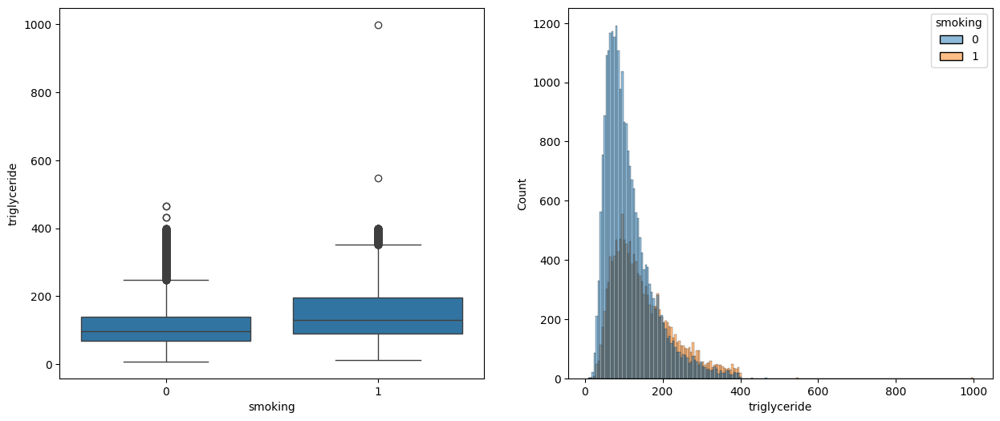

In [ ]:
fig, axes = plt.subplots(1, 2, figsize = (15, 6))

sns.boxplot(ax = axes[0], data = df, x = 'smoking', y = 'triglyceride');
sns.histplot(data = df, x = 'triglyceride', hue = 'smoking');

From the above chart, we see the smokers, on average, have higher triglyceride. Next, we explore the relationship between HDL and smoking.

<ipython-input-29-ecf82d4698a6>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




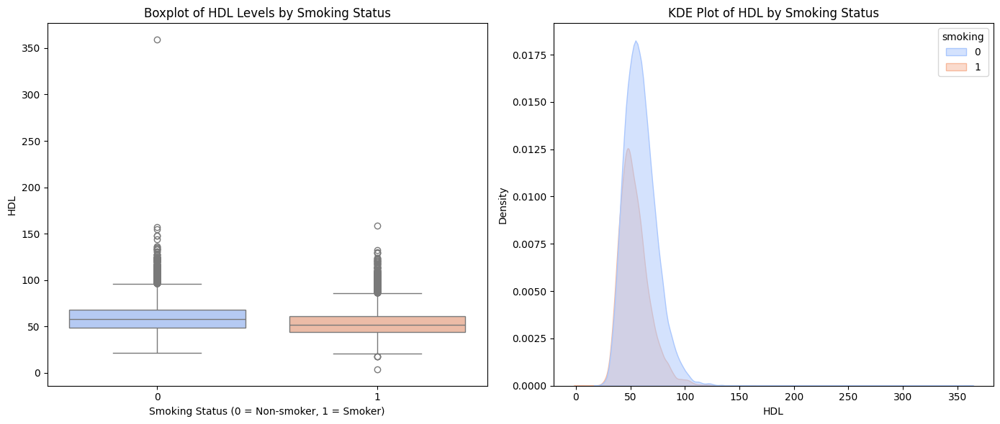

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# 1. Boxplot
sns.boxplot(x='smoking', y='HDL', data=df, palette='coolwarm', ax=axes[0])
axes[0].set_title('Boxplot of HDL Levels by Smoking Status')
axes[0].set_xlabel('Smoking Status (0 = Non-smoker, 1 = Smoker)')
axes[0].set_ylabel('HDL')

# 2. KDE Plot
sns.kdeplot(data=df, x='HDL', hue='smoking', fill=True, palette='coolwarm', alpha=0.5, ax=axes[1])
axes[1].set_title('KDE Plot of HDL by Smoking Status')
axes[1].set_xlabel('HDL')
axes[1].set_ylabel('Density')

plt.tight_layout()
plt.show()

From the above charts, we see that non-smokers, on average, have higher HDL than smokers. Next, we explore the relationship between LDL and smoking.

<ipython-input-30-d16c805d5344>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




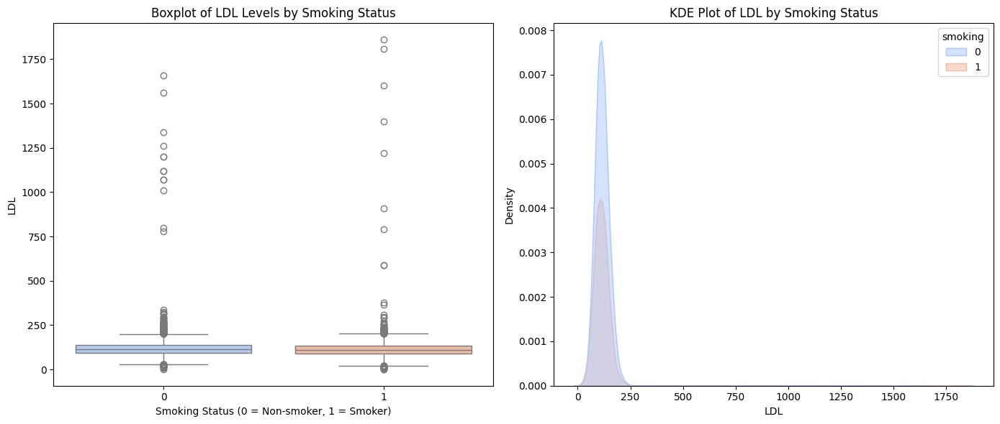

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# 1. Boxplot
sns.boxplot(x='smoking', y='LDL', data=df, palette='coolwarm', ax=axes[0])
axes[0].set_title('Boxplot of LDL Levels by Smoking Status')
axes[0].set_xlabel('Smoking Status (0 = Non-smoker, 1 = Smoker)')
axes[0].set_ylabel('LDL')

# 2. KDE Plot
sns.kdeplot(data=df, x='LDL', hue='smoking', fill=True, palette='coolwarm', alpha=0.5, ax=axes[1])
axes[1].set_title('KDE Plot of LDL by Smoking Status')
axes[1].set_xlabel('LDL')
axes[1].set_ylabel('Density')

plt.tight_layout()
plt.show()

The LDL distributions of non-smokers and smokers are very similar. Next, we explore the relationship between hemoglobin and smoking.

<ipython-input-31-372e36f09f36>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




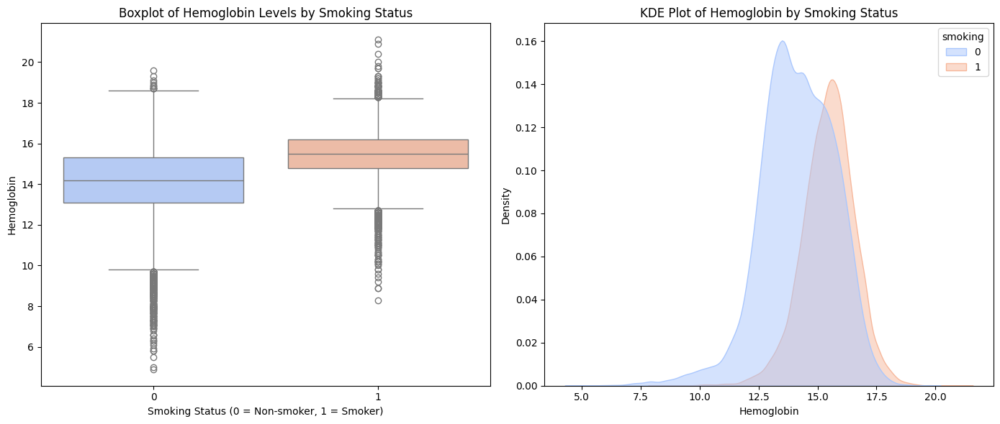

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# 1. Boxplot
sns.boxplot(x='smoking', y='hemoglobin', data=df, palette='coolwarm', ax=axes[0])
axes[0].set_title('Boxplot of Hemoglobin Levels by Smoking Status')
axes[0].set_xlabel('Smoking Status (0 = Non-smoker, 1 = Smoker)')
axes[0].set_ylabel('Hemoglobin')

# 2. KDE Plot
sns.kdeplot(data=df, x='hemoglobin', hue='smoking', fill=True, palette='coolwarm', alpha=0.5, ax=axes[1])
axes[1].set_title('KDE Plot of Hemoglobin by Smoking Status')
axes[1].set_xlabel('Hemoglobin')
axes[1].set_ylabel('Density')

plt.tight_layout()
plt.show()

From the above, it is clear the hemoglobin of smokers, on average, is higher. Next we explore the relationship between serum creatinine and smoking.

In [ ]:
pd.crosstab(df['serum creatinine'], df['smoking'])

smoking,0,1
serum creatinine,,
0.1,7,8
0.2,1,1
0.3,6,1
0.4,133,10
0.5,931,91
0.6,2817,320
0.7,4163,1071
0.8,5019,2344
0.9,4448,3515


From the above table, there are a couple of serum creatinine values that are different from the others (3, 6.4, and 9.9). Next, we explore the relationship between AST and smoking.

<ipython-input-33-0170ba007e02>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




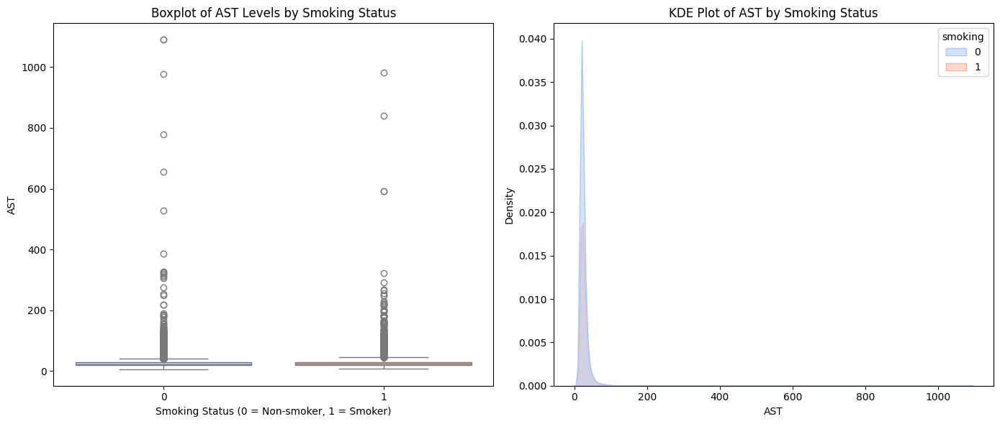

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# 1. Boxplot
sns.boxplot(x='smoking', y='AST', data=df, palette='coolwarm', ax=axes[0])
axes[0].set_title('Boxplot of AST Levels by Smoking Status')
axes[0].set_xlabel('Smoking Status (0 = Non-smoker, 1 = Smoker)')
axes[0].set_ylabel('AST')

# 2. KDE Plot
sns.kdeplot(data=df, x='AST', hue='smoking', fill=True, palette='coolwarm', alpha=0.5, ax=axes[1])
axes[1].set_title('KDE Plot of AST by Smoking Status')
axes[1].set_xlabel('AST')
axes[1].set_ylabel('Density')

plt.tight_layout()
plt.show()

The AST distributions of non-smokers and smokers are very similar. Next, we explore the relationship between ALT and smoking.

<ipython-input-34-7f6f4a342532>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




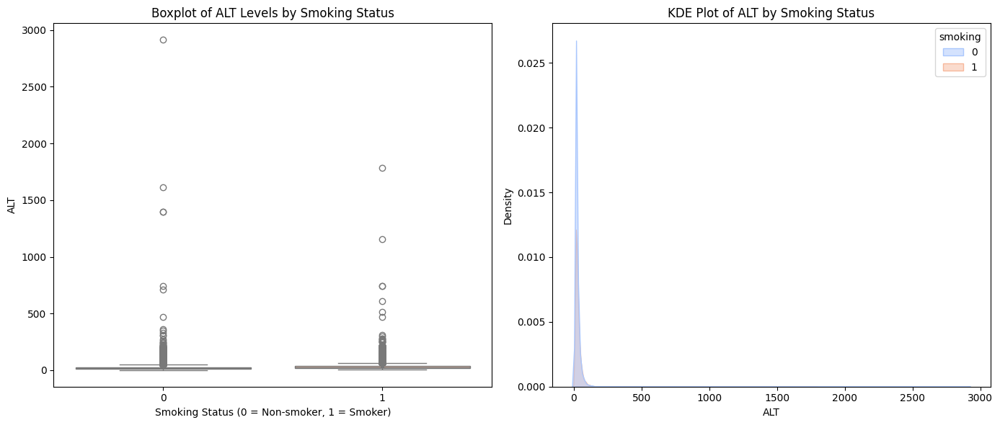

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# 1. Boxplot
sns.boxplot(x='smoking', y='ALT', data=df, palette='coolwarm', ax=axes[0])
axes[0].set_title('Boxplot of ALT Levels by Smoking Status')
axes[0].set_xlabel('Smoking Status (0 = Non-smoker, 1 = Smoker)')
axes[0].set_ylabel('ALT')

# 2. KDE Plot
sns.kdeplot(data=df, x='ALT', hue='smoking', fill=True, palette='coolwarm', alpha=0.5, ax=axes[1])
axes[1].set_title('KDE Plot of ALT by Smoking Status')
axes[1].set_xlabel('ALT')
axes[1].set_ylabel('Density')

plt.tight_layout()
plt.show()

The AST distributions of non-smokers and smokers are very similar. Next, we explore the relationship between Gpt and smoking.

<ipython-input-35-dec4b0583362>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




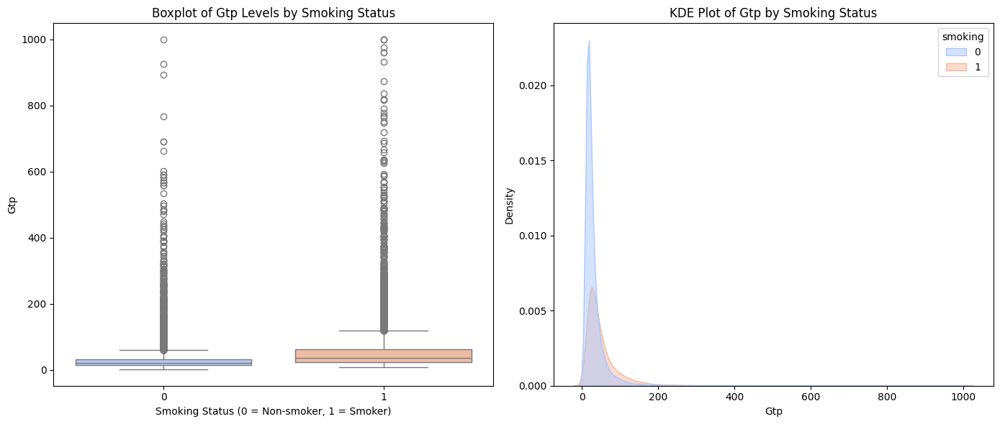

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# 1. Boxplot
sns.boxplot(x='smoking', y='Gtp', data=df, palette='coolwarm', ax=axes[0])
axes[0].set_title('Boxplot of Gtp Levels by Smoking Status')
axes[0].set_xlabel('Smoking Status (0 = Non-smoker, 1 = Smoker)')
axes[0].set_ylabel('Gtp')

# 2. KDE Plot
sns.kdeplot(data=df, x='Gtp', hue='smoking', fill=True, palette='coolwarm', alpha=0.5, ax=axes[1])
axes[1].set_title('KDE Plot of Gtp by Smoking Status')
axes[1].set_xlabel('Gtp')
axes[1].set_ylabel('Density')

plt.tight_layout()
plt.show()

From the above, smokers, on average, have a higher Gtp. Next, we explore the relationship between dental caries and smoking.

In [ ]:
pd.crosstab(df['dental caries'], df['smoking'], normalize = 'index')

smoking,0,1
dental caries,,
0,0.659820,0.340180
1,0.533437,0.466563


From the above, we see that when dental caries = 0, the likelihood of being smoker is about 34%. On the other hand, when dental caries = 1, the likelihood of being smoker is about 46%.

## Multivariate Analysis

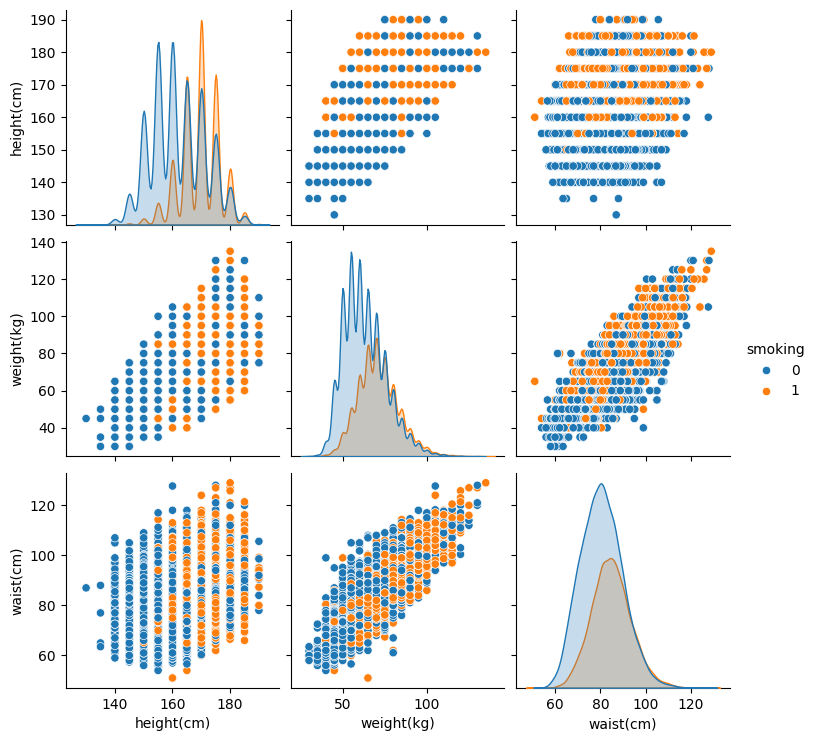

In [ ]:
sns.pairplot(data = df[['height(cm)', 'weight(kg)', 'waist(cm)', 'smoking']], hue = 'smoking')

From the above pair-plots, these are a couple of observations:

* Taller people (heavier as well) tend to smoke.
* The relationship between weight(kg) and waist(cm) is more or less linear.

These are some takeaways from the EDA:

* The relationship between some of input features and smoking is not clear (or not clear distinction between the distribution of the two groups).
* Some of the features have a more clear relationship with smoking (height, triglyceride, and hemoglobin).

## Feature Engineering

In [ ]:
df.columns

Index(['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)',
       'eyesight(right)', 'hearing(left)', 'hearing(right)', 'systolic',
       'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride',
       'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST',
       'ALT', 'Gtp', 'dental caries', 'smoking'],
      dtype='object')

Adding BMI, Hight weight ratio, and Height age ratio

In [ ]:
############################# Train data
# 1. BMI Calculation
df['BMI'] = df['weight(kg)'] / ((df['height(cm)'] / 100) ** 2)

# 2. Blood Pressure Ratio
df['blood_pressure_ratio'] = df['systolic'] / df['relaxation']

# 3. Total Cholesterol Calculation
df['total_cholesterol'] = df['HDL'] + df['LDL'] + (df['triglyceride'] / 0.2)

# 4. Creatinine Clearance
df['creatinine_clearance'] = ((140 - df['age']) * df['weight(kg)']) / (72 * df['serum creatinine'])

# 5. Average Eyesight
df['average_eyesight'] = (df['eyesight(right)'] + df['eyesight(left)']) / 2

# 5. Average hearing
df['average_hearing'] = (df['hearing(right)'] + df['hearing(left)']) / 2

############################# Test data
# 1. BMI Calculation
df_test['BMI'] = df_test['weight(kg)'] / ((df_test['height(cm)'] / 100) ** 2)

# 2. Blood Pressure Ratio
df_test['blood_pressure_ratio'] = df_test['systolic'] / df_test['relaxation']

# 3. Total Cholesterol Calculation
df_test['total_cholesterol'] = df_test['HDL'] + df_test['LDL'] + (df_test['triglyceride'] / 0.2)

# 4. Creatinine Clearance
df_test['creatinine_clearance'] = ((140 - df_test['age']) * df_test['weight(kg)']) / (72 * df_test['serum creatinine'])

# 5. Average Eyesight
df_test['average_eyesight'] = (df_test['eyesight(right)'] + df_test['eyesight(left)']) / 2

# 5. Average hearing
df_test['average_hearing'] = (df_test['hearing(right)'] + df_test['hearing(left)']) / 2


In [ ]:
df[['BMI', 'blood_pressure_ratio', 'total_cholesterol', 'creatinine_clearance', 'average_eyesight','average_hearing']]

,BMI,blood_pressure_ratio,total_cholesterol,creatinine_clearance,average_eyesight,average_hearing
0,29.411765,1.512821,977.0,123.958333,0.90,1.0
1,35.918367,1.506329,825.0,166.666667,0.80,1.0
2,27.055151,1.375000,769.0,142.939815,0.90,1.0
3,29.384757,1.795455,1967.0,117.283951,0.75,1.0
4,22.038567,1.703125,1139.0,83.333333,0.80,1.0
...,...,...,...,...,...,...
38979,22.038567,1.783333,398.0,166.666667,0.50,1.0
38980,22.892820,1.750000,707.0,120.949074,1.35,1.0
38981,36.332180,1.658824,1166.0,182.291667,0.55,1.0
38982,21.484375,1.376812,435.0,127.314815,1.50,1.0


## checking if we will delete the old features or not

### Correlation

In [ ]:
num_cols = [column for column in df.columns if df[column].nunique() > 10]

cat_cols = [column for column in df.columns if df[column].nunique() < 10]

print(f"Observations: {df.shape[0]}")
print(f"Variables: {df.shape[1]}")
print(f"Categorical columns: {len(cat_cols)}")
print(cat_cols)
print(f"Numerical columns: {len(num_cols)}")
print(num_cols)

Observations: 38984
Variables: 29
Categorical columns: 6
['hearing(left)', 'hearing(right)', 'Urine protein', 'dental caries', 'smoking', 'average_hearing']
Numerical columns: 23
['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'serum creatinine', 'AST', 'ALT', 'Gtp', 'BMI', 'blood_pressure_ratio', 'total_cholesterol', 'creatinine_clearance', 'average_eyesight']


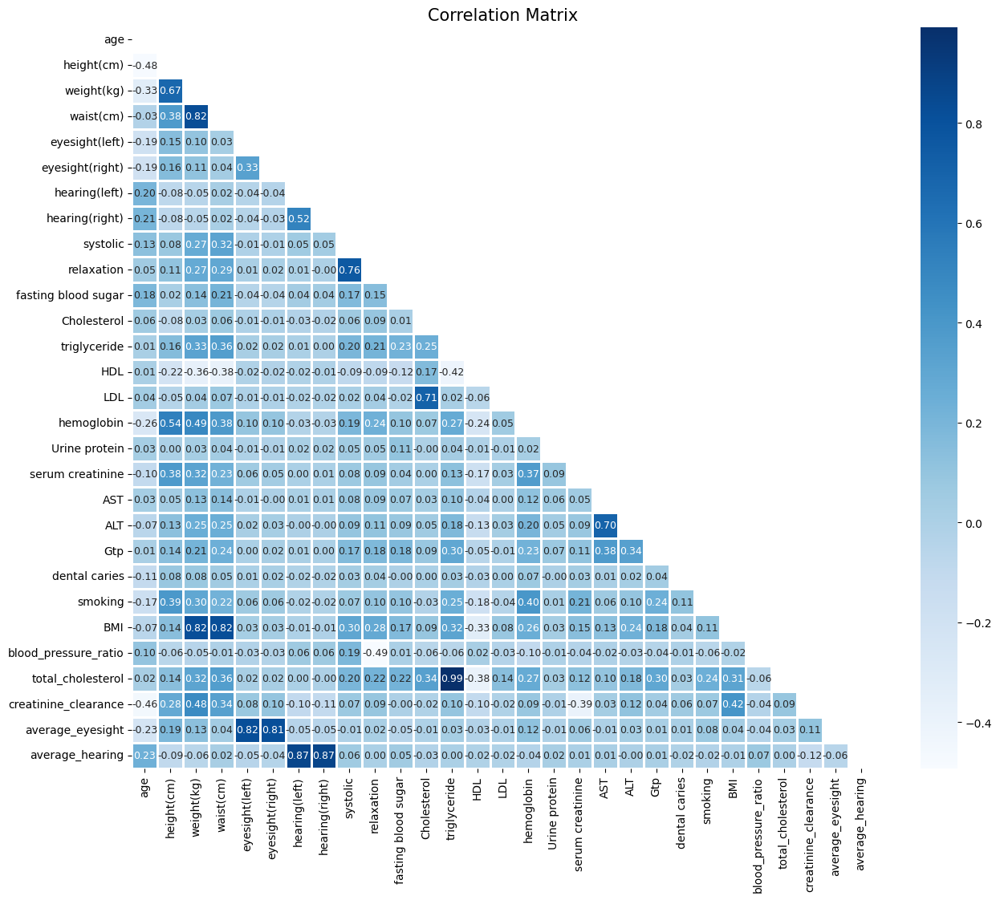

In [ ]:
corr_matrix = df.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(15, 12))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='Blues', fmt='.2f', linewidths=1, square=True, annot_kws={"size": 9} )
plt.title('Correlation Matrix', fontsize=15)
plt.show()

In [ ]:
# triglyceride , hearing left and right , eyesight left and right ,wieght

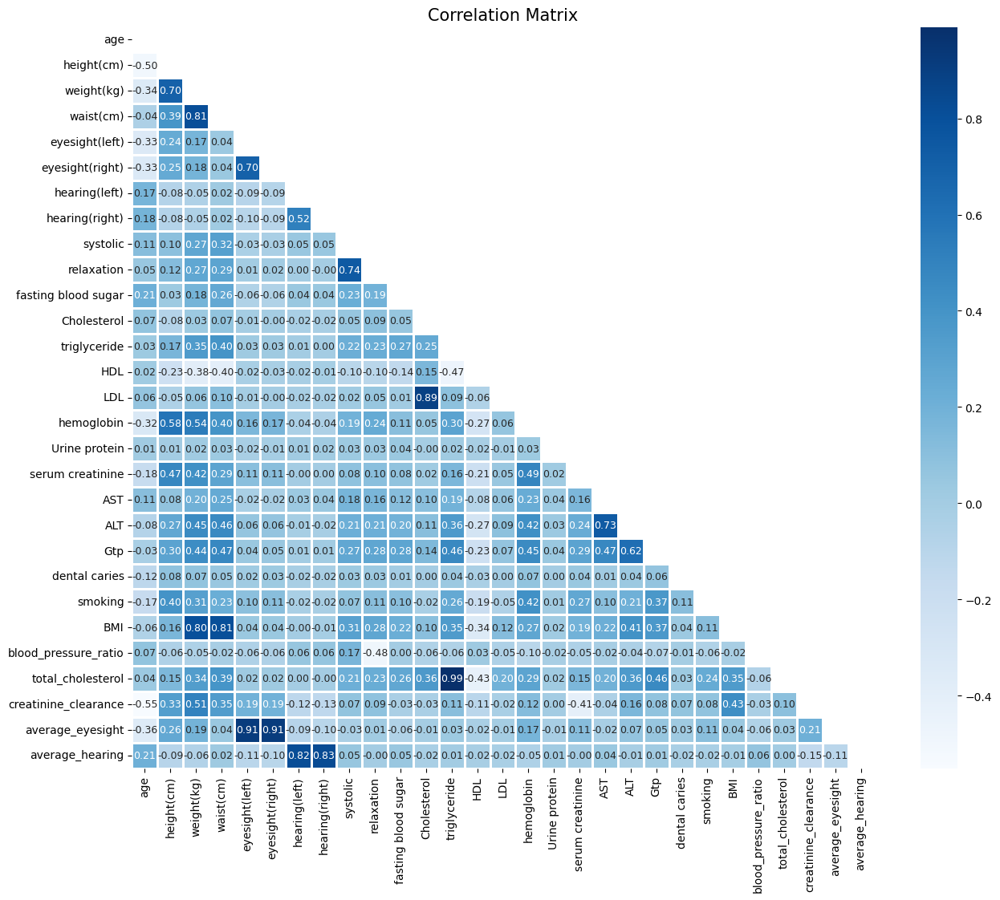

In [ ]:
corr_matrix = df.corr(method='spearman')
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(15, 12))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='Blues', fmt='.2f', linewidths=1, square=True, annot_kws={"size": 9} )
plt.title('Correlation Matrix', fontsize=15)
plt.show()

### feature importance with random forest

In [ ]:
target='smoking'

In [ ]:
X = df.drop(columns=[target])
y = df[target]

rf = RandomForestClassifier(n_estimators=100, random_state=42 , n_jobs=-1)
rf.fit(X, y)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [ ]:
feature_importances = rf.feature_importances_

# Create a DataFrame for better visualization
feature_importances_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort features by importance
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

print(feature_importances_df)

                 Feature  Importance
15            hemoglobin    0.107171
1             height(cm)    0.087461
20                   Gtp    0.086974
24     total_cholesterol    0.048898
12          triglyceride    0.048187
25  creatinine_clearance    0.040148
13                   HDL    0.039867
14                   LDL    0.039469
23  blood_pressure_ratio    0.039220
11           Cholesterol    0.038923
19                   ALT    0.038900
10   fasting blood sugar    0.037869
3              waist(cm)    0.037244
17      serum creatinine    0.035924
18                   AST    0.034834
8               systolic    0.034631
22                   BMI    0.031604
9             relaxation    0.031517
0                    age    0.031122
2             weight(kg)    0.030987
26      average_eyesight    0.025371
4         eyesight(left)    0.019409
5        eyesight(right)    0.019039
21         dental caries    0.007295
16         Urine protein    0.003689
27       average_hearing    0.001887
7

### Action

In [ ]:
columns_to_drop = ['weight(kg)', 'triglyceride', 'eyesight(right)', 'eyesight(left)', 'hearing(right)' ,'hearing(left)']
df_train_reduced = df.drop(columns=columns_to_drop)
df_test_reduced = df_test.drop(columns=columns_to_drop)


## data spliting

In [ ]:
target='smoking'

In [ ]:
X=df.drop(columns=[target])
y=df[target]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

## Anomaly Detection Check


In [ ]:
from sklearn.ensemble import IsolationForest

In [ ]:
isolation_forest = IsolationForest(n_estimators=100,random_state=42,bootstrap=True, n_jobs=-1).fit(X_train )
y_IsoPre = isolation_forest.predict(X_train)
y_IsoPre

array([1, 1, 1, ..., 1, 1, 1])

In [ ]:
results = pd.DataFrame({'Class': y_train, 'Anomaly': y_IsoPre})
anomalies_per_class = results[results['Anomaly'] == -1].groupby('Class').size()
anomalies_per_class

,0
Class,
0,872
1,595


In [ ]:
X_train.shape

(31187, 28)

### drop the anomaly

In [ ]:
mask = y_IsoPre == 1
X_train = X_train[mask]

In [ ]:
y_train = y_train[mask]

In [ ]:
X_train.shape

(29720, 28)

In [ ]:
y_train.shape

(29720,)

In [ ]:
scaler = StandardScaler()
pca = PCA()
X_train_scaled = scaler.fit_transform(X_train)
X_train_red = pca.fit_transform(X_train_scaled)
d = {'Number of EigenVector': np.arange(1,len(pd.DataFrame(X_train).columns)+1), 'Varaiability Captured': np.cumsum(pca.explained_variance_ratio_)}
df = pd.DataFrame(data=d)
px.line(df, x='Number of EigenVector', y='Varaiability Captured',markers=True,
                       title='EigenVectors VS Varaiability Captured')

###### will reduce to 21 col

In [ ]:
from scipy import stats
from sklearn.preprocessing import PowerTransformer
from sklearn.base import BaseEstimator, TransformerMixin

In [ ]:
# transfomation classes
class LogTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, constant=1):
        self.constant = constant

    def fit(self, X, y=None):
        # No fitting necessary for log transformation
        return self

    def transform(self, X):
        # Apply log transformation
        return np.log(X + self.constant)

class BoxCoxTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.lmbdas = {}

    def fit(self, X, y=None):
        self.lmbdas = {}
        for col in X.columns:
            if (X[col] > 0).all():
                # Fit Box-Cox transformation for positive-only columns
                _, lmbda = stats.boxcox(X[col])
                self.lmbdas[col] = lmbda
            elif (X[col] >= 0).all():
                # Shift column and fit Box-Cox for non-negative columns
                shift_value = 1
                _, lmbda = stats.boxcox(X[col] + shift_value)
                self.lmbdas[col] = (lmbda, shift_value)
            else:
                # Column contains negative values, which are not suitable for Box-Cox
                self.lmbdas[col] = None
        return self

    def transform(self, X):
        X_transformed = X.copy()
        for col in X.columns:
            if self.lmbdas[col] is not None:
                if isinstance(self.lmbdas[col], tuple):
                    lmbda, shift_value = self.lmbdas[col]
                    X_transformed[col] = stats.boxcox(X[col] + shift_value, lmbda=lmbda)
                else:
                    X_transformed[col] = stats.boxcox(X[col], lmbda=self.lmbdas[col])
            else:
                print(f"Column {col} contains negative values and cannot be Box-Cox transformed.")
        return X_transformed

class YeoJohnsonTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, standardize=True):
        self.standardize = standardize
        self.transformer = PowerTransformer(method='yeo-johnson', standardize=self.standardize)

    def fit(self, X, y=None):
        self.transformer.fit(X)
        return self

    def transform(self, X):
        X_transformed = self.transformer.transform(X)
        # Convert back to DataFrame to retain column names and index
        X_transformed = pd.DataFrame(X_transformed, columns=X.columns, index=X.index)
        return X_transformed

# Modeling

In [ ]:
!pip install imblearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.3/258.3 kB 2.0 MB/s eta 0:00:00


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier , AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report ,f1_score, fbeta_score, roc_auc_score
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
import itertools

In [ ]:
sampling_methods = [
    ('none', None),  # No sampling
    # ('smote', SMOTE(random_state=42)),
    ('rus', RandomUnderSampler(random_state=42))
]

transformations = [
    ('none', None),  # No transformation
    ('log', LogTransformer(constant=1)),
    ('yeo_johnson', YeoJohnsonTransformer(standardize=True))
]

scaling_methods = [
    ('standard', StandardScaler()),
    ('minmax', MinMaxScaler()),
    ('robust', RobustScaler())
]

dim_reduction_options = [
    ('none', None),  # No PCA
    ('pca_21', PCA(n_components=21))
]

classifiers = [
    ('logreg', LogisticRegression(n_jobs=-1)),
    ('rf', RandomForestClassifier(random_state=42 , n_jobs=-1)),
    ('dt', DecisionTreeClassifier(random_state=42 )),
    # ('lin_svc', SVC(probability=True , kernel='linear')),
    # ('poly_svc', SVC(probability=True , kernel='poly')),
    # ('rbf_svc', SVC(probability=True , kernel = 'rbf')),
    ('knn_5', KNeighborsClassifier(n_jobs=-1)),
    ('xgboost', XGBClassifier(n_jobs=-1)),
    ('gradboost', GradientBoostingClassifier()),
]

combinations = list(itertools.product(sampling_methods, transformations, scaling_methods, dim_reduction_options, classifiers))


In [ ]:
# Define a DataFrame to store the results
results_df = pd.DataFrame(columns=[
    'Sampling Method', 'Transformation Method', 'Scaling Method',
    'Dim Reduction Method', 'Model Name', 'Accuracy Train',
    'Accuracy Test', 'F1 Train', 'F-beta Train','F1 Test', 'F-beta Test',
    'ROC AUC Train', 'ROC AUC Test'
])

for combo in combinations:
    sampling_name, sampling_method = combo[0]
    transform_name, transform_method = combo[1]
    scaling_name, scaling_method = combo[2]
    dim_reduction_name, dim_reduction_method = combo[3]
    classifier_name, classifier_method = combo[4]

    # Set up the pipeline steps
    steps = []
    if sampling_method is not None:
        steps.append(('sampling', sampling_method))
    if transform_method is not None:
        steps.append(('transformation', transform_method))
    if scaling_method is not None:
        steps.append(('scaling', scaling_method))
    if dim_reduction_method is not None:
        steps.append(('dim_reduction', dim_reduction_method))
    steps.append(('classifier', classifier_method))

    # Use imbalanced pipeline if using sampling
    if sampling_method is not None:
        pipeline = ImbPipeline(steps)
    else:
        pipeline = Pipeline(steps)

    # Fit the pipeline on the training data
    pipeline.fit(X_train, y_train)

    # Predictions on train and test data
    y_train_pred = pipeline.predict(X_train)
    y_test_pred = pipeline.predict(X_test)

    # Score on the training data
    train_score = pipeline.score(X_train, y_train)
    # Score on the test data
    test_score = pipeline.score(X_test, y_test)

    # Calculate additional metrics
    f1_train = f1_score(y_train, y_train_pred)
    f1_test = f1_score(y_test, y_test_pred)
    fbeta_train = fbeta_score(y_train, y_train_pred, beta=5)  # Adjust beta as needed
    fbeta_test = fbeta_score(y_test, y_test_pred, beta=5)
    roc_auc_train = roc_auc_score(y_train, pipeline.predict_proba(X_train)[:, 1])
    roc_auc_test = roc_auc_score(y_test, pipeline.predict_proba(X_test)[:, 1])

        # Append results to the DataFrame
    new_row = pd.DataFrame({
    'Sampling Method': [sampling_name],
    'Transformation Method': [transform_name],
    'Scaling Method': [scaling_name],
    'Dim Reduction Method': [dim_reduction_name],
    'Model Name': [classifier_name],
    'Accuracy Train': [train_score],
    'Accuracy Test': [test_score],
    'F1 Train': [f1_train],
    'F-beta Train': [fbeta_train],
    'F1 Test': [f1_test],
    'F-beta Test': [fbeta_test],
    'ROC AUC Train': [roc_auc_train],
    'ROC AUC Test': [roc_auc_test]
    })

    # Append the new row to the results DataFrame
    results_df = pd.concat([results_df, new_row], ignore_index=True)

    print(f"Combination: {sampling_name}, {transform_name}, {scaling_name}, {dim_reduction_name}, {classifier_name} - "
          f"Train Score: {train_score:.4f} - Test Score: {test_score:.4f} - F1 Train: {f1_train:.4f} - "
          f"F-beta Train: {fbeta_train:.4f} - F1 Test: {f1_test:.4f} - F-beta Test: {fbeta_test:.4f} - ROC AUC Train: {roc_auc_train:.4f} - "
          f"ROC AUC Test: {roc_auc_test:.4f}")

# Display the results DataFrame
print(results_df)


<ipython-input-64-c4d434bbab2b>:72: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Combination: none, none, standard, none, logreg - Train Score: 0.7280 - Test Score: 0.7189 - F1 Train: 0.6072 - F-beta Train: 0.5779 - F1 Test: 0.6007 - F-beta Test: 0.5776 - ROC AUC Train: 0.8110 - ROC AUC Test: 0.8010
Combination: none, none, standard, none, rf - Train Score: 1.0000 - Test Score: 0.7933 - F1 Train: 1.0000 - F-beta Train: 1.0000 - F1 Test: 0.7165 - F-beta Test: 0.7116 - ROC AUC Train: 1.0000 - ROC AUC Test: 0.8784
Combination: none, none, standard, none, dt - Train Score: 1.0000 - Test Score: 0.7328 - F1 Train: 1.0000 - F-beta Train: 1.0000 - F1 Test: 0.6398 - F-beta Test: 0.6455 - ROC AUC Train: 1.0000 - ROC AUC Test: 0.7146
Combination: none, none, standard, none, knn_5 - Train Score: 0.8137 - Test Score: 0.7136 - F1 Train: 0.7390 - F-beta Train: 0.7233 - F1 Test: 0.6002 - F-beta Test: 0.5863 - ROC AUC Train: 0.8955 - ROC AUC Test: 0.7745
Combination: none, none, standard, none, xgboost - Train Score: 0.8934 - Test Score: 0.7659 - F1 Train: 0.8544 - F-beta Train: 0.

In [ ]:
results_df=pd.read_csv('defaultParameters_Xsvc.csv')

In [ ]:
results_df[results_df['F1 Test'] == results_df['F1 Test'].max()]

,Sampling Method,Transformation Method,Scaling Method,Dim Reduction Method,Model Name,Accuracy Train,Accuracy Test,F1 Train,F-beta Train,F1 Test,F-beta Test,ROC AUC Train,ROC AUC Test
211,rus,yeo_johnson,robust,pca_21,rf,0.926211,0.76491,0.908285,0.992292,0.726295,0.838254,0.997301,0.865688


In [ ]:
results_df[results_df['Accuracy Test'] == results_df['Accuracy Test'].max()]

,Sampling Method,Transformation Method,Scaling Method,Dim Reduction Method,Model Name,Accuracy Train,Accuracy Test,F1 Train,F-beta Train,F1 Test,F-beta Test,ROC AUC Train,ROC AUC Test
25,none,none,robust,none,rf,1.0,0.794793,1.0,1.0,0.717813,0.711099,1.0,0.87854


In [ ]:
results_df[results_df['ROC AUC Test'] == results_df['ROC AUC Test'].max()]

,Sampling Method,Transformation Method,Scaling Method,Dim Reduction Method,Model Name,Accuracy Train,Accuracy Test,F1 Train,F-beta Train,F1 Test,F-beta Test,ROC AUC Train,ROC AUC Test
73,none,yeo_johnson,standard,none,rf,1.0,0.792356,1.0,1.0,0.713299,0.703978,1.0,0.879025


In [ ]:
results_df.nlargest(3, 'ROC AUC Test')

,Sampling Method,Transformation Method,Scaling Method,Dim Reduction Method,Model Name,Accuracy Train,Accuracy Test,F1 Train,F-beta Train,F1 Test,F-beta Test,ROC AUC Train,ROC AUC Test
73,none,yeo_johnson,standard,none,rf,1.0,0.792356,1.0,1.0,0.713299,0.703978,1.0,0.879025
67,none,log,robust,pca_21,rf,1.0,0.791073,1.0,1.0,0.704624,0.680368,1.0,0.878983
61,none,log,robust,none,rf,1.0,0.794408,1.0,1.0,0.717334,0.710740,1.0,0.878666


Text(0, 0.5, 'F1 Test')

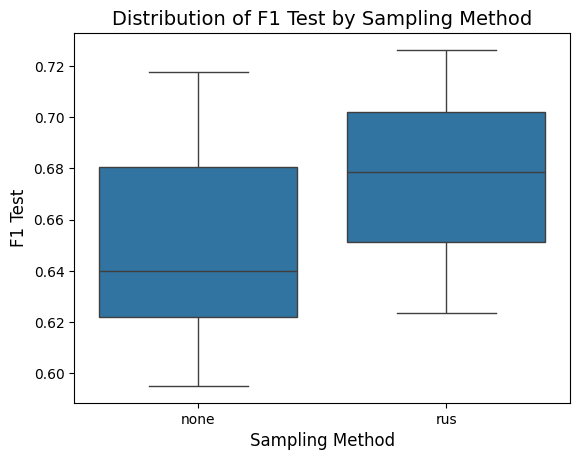

In [ ]:
sns.boxplot(x='Sampling Method', y='F1 Test', data=results_df)

plt.title('Distribution of F1 Test by Sampling Method', fontsize=14)
plt.xlabel('Sampling Method', fontsize=12)
plt.ylabel('F1 Test', fontsize=12)

Text(0, 0.5, 'Accuracy Test')

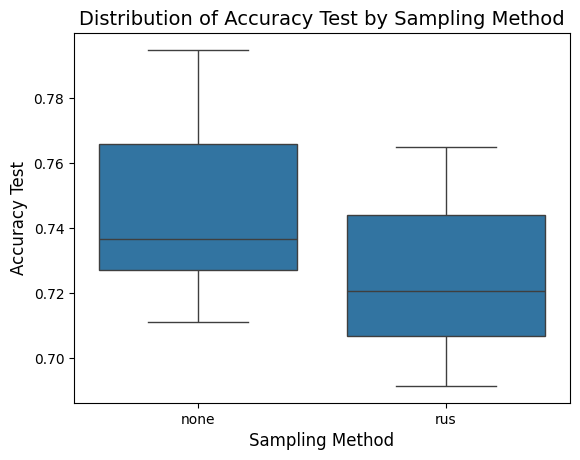

In [ ]:
sns.boxplot(x='Sampling Method', y='Accuracy Test', data=results_df)

plt.title('Distribution of Accuracy Test by Sampling Method', fontsize=14)
plt.xlabel('Sampling Method', fontsize=12)
plt.ylabel('Accuracy Test', fontsize=12)

Text(0, 0.5, 'F1 Test')

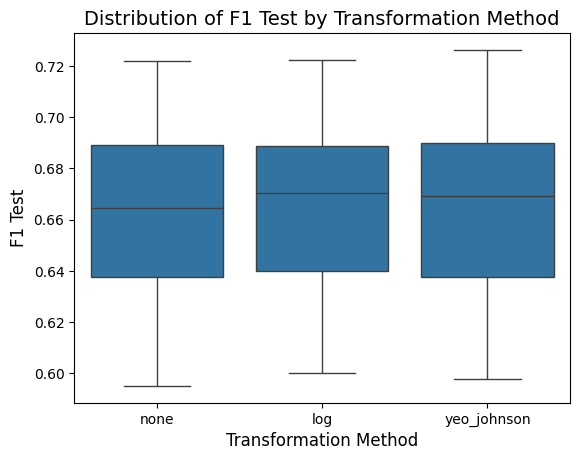

In [ ]:
sns.boxplot(x='Transformation Method', y='F1 Test', data=results_df)

plt.title('Distribution of F1 Test by Transformation Method', fontsize=14)
plt.xlabel('Transformation Method', fontsize=12)
plt.ylabel('F1 Test', fontsize=12)

Text(0, 0.5, 'Accuracy Test')

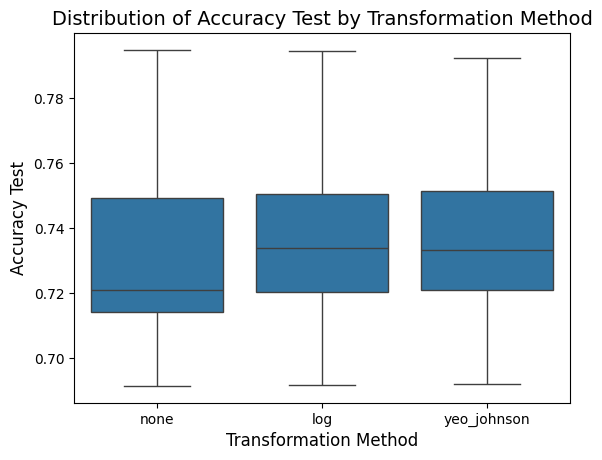

In [ ]:
sns.boxplot(x='Transformation Method', y='Accuracy Test', data=results_df)

plt.title('Distribution of Accuracy Test by Transformation Method', fontsize=14)
plt.xlabel('Transformation Method', fontsize=12)
plt.ylabel('Accuracy Test', fontsize=12)

Text(0, 0.5, 'F1 Test')

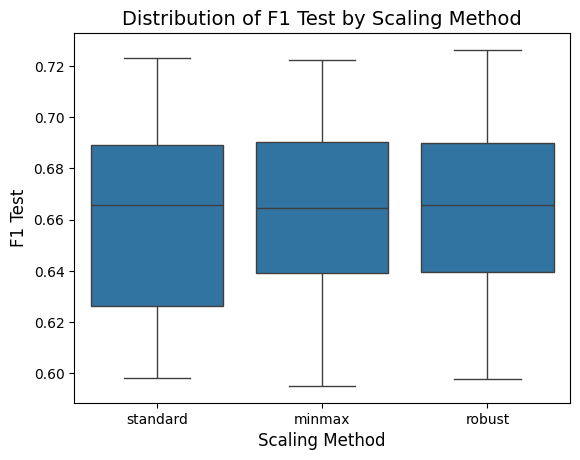

In [ ]:
sns.boxplot(x='Scaling Method', y='F1 Test', data=results_df)

plt.title('Distribution of F1 Test by Scaling Method', fontsize=14)
plt.xlabel('Scaling Method', fontsize=12)
plt.ylabel('F1 Test', fontsize=12)

Text(0, 0.5, 'Accuracy Test')

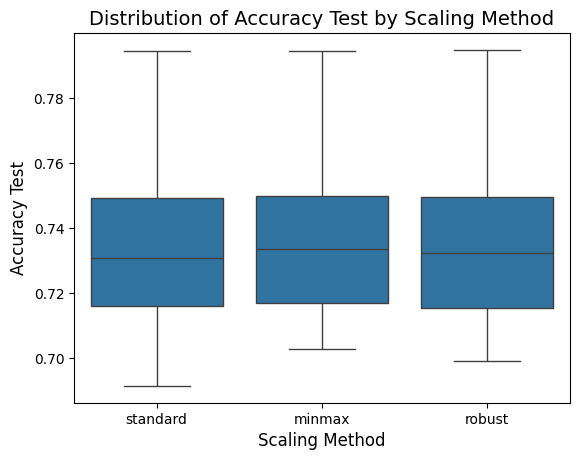

In [ ]:
sns.boxplot(x='Scaling Method', y='Accuracy Test', data=results_df)

plt.title('Distribution of Accuracy Test by Scaling Method', fontsize=14)
plt.xlabel('Scaling Method', fontsize=12)
plt.ylabel('Accuracy Test', fontsize=12)

Text(0, 0.5, 'F1 Test')

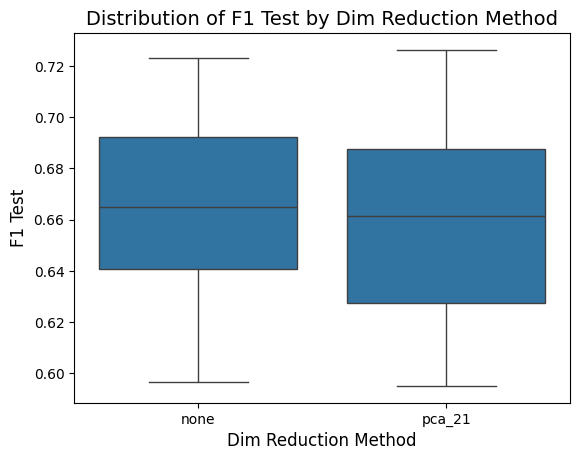

In [ ]:
sns.boxplot(x='Dim Reduction Method', y='F1 Test', data=results_df)

plt.title('Distribution of F1 Test by Dim Reduction Method', fontsize=14)
plt.xlabel('Dim Reduction Method', fontsize=12)
plt.ylabel('F1 Test', fontsize=12)

Text(0, 0.5, 'Accuracy Test')

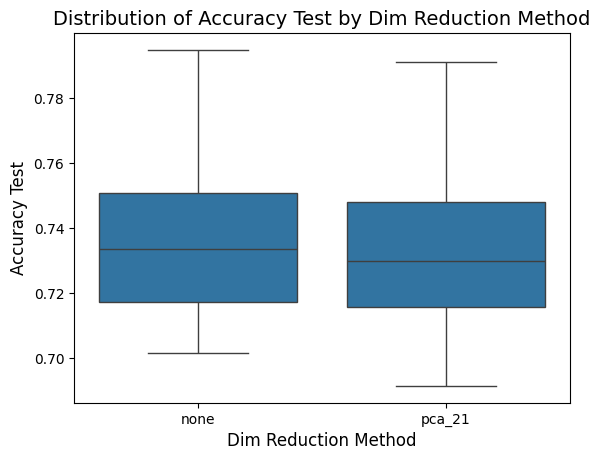

In [ ]:
sns.boxplot(x='Dim Reduction Method', y='Accuracy Test', data=results_df)

plt.title('Distribution of Accuracy Test by Dim Reduction Method', fontsize=14)
plt.xlabel('Dim Reduction Method', fontsize=12)
plt.ylabel('Accuracy Test', fontsize=12)

Text(0, 0.5, 'F1 Test')

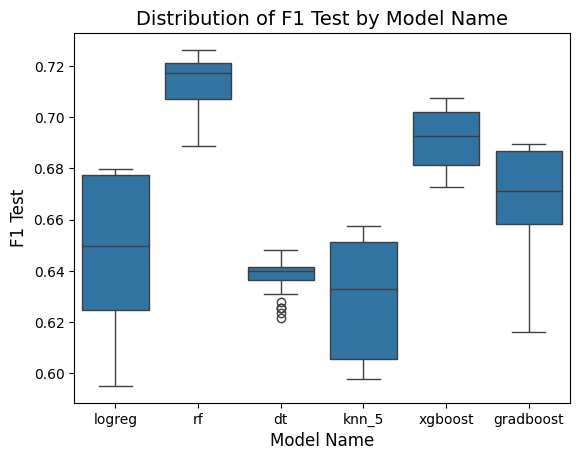

In [ ]:
sns.boxplot(x='Model Name', y='F1 Test', data=results_df)

plt.title('Distribution of F1 Test by Model Name', fontsize=14)
plt.xlabel('Model Name', fontsize=12)
plt.ylabel('F1 Test', fontsize=12)

Text(0, 0.5, 'Accuracy Test')

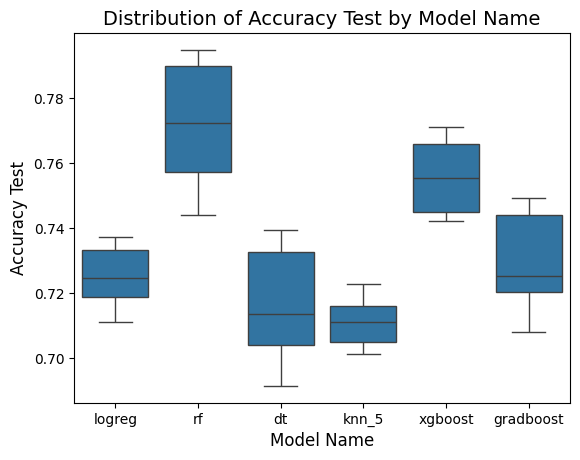

In [ ]:
sns.boxplot(x='Model Name', y='Accuracy Test', data=results_df)

plt.title('Distribution of Accuracy Test by Model Name', fontsize=14)
plt.xlabel('Model Name', fontsize=12)
plt.ylabel('Accuracy Test', fontsize=12)

Text(0, 0.5, 'F1 Score')

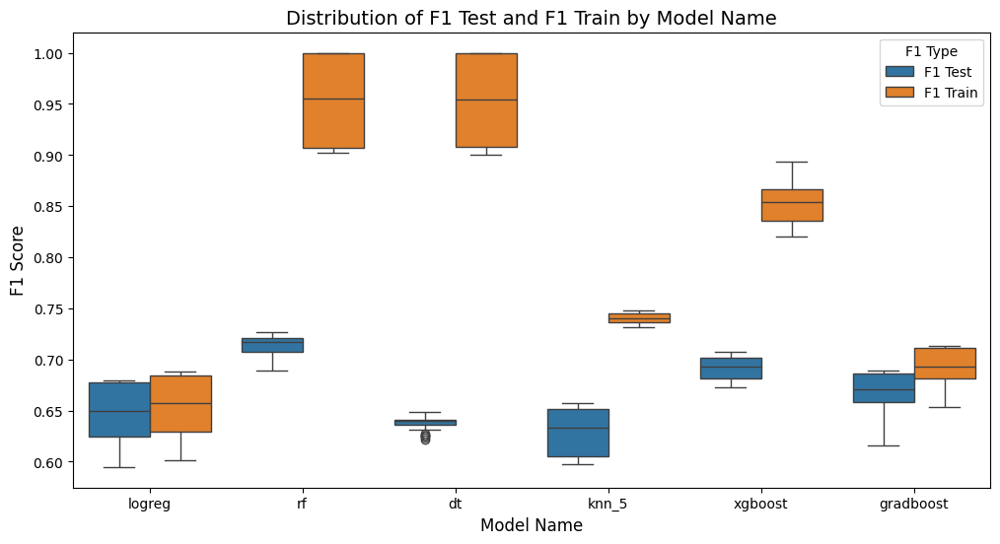

In [ ]:
df_melted = pd.melt(results_df, id_vars=['Model Name'], value_vars=['F1 Test', 'F1 Train'],
                    var_name='F1 Type', value_name='F1 Score')

plt.figure(figsize=(12, 6))
sns.boxplot(x='Model Name', y='F1 Score', hue='F1 Type', data=df_melted)

plt.title('Distribution of F1 Test and F1 Train by Model Name', fontsize=14)
plt.xlabel('Model Name', fontsize=12)
plt.ylabel('F1 Score', fontsize=12)

Text(0, 0.5, 'Accuracy Score')

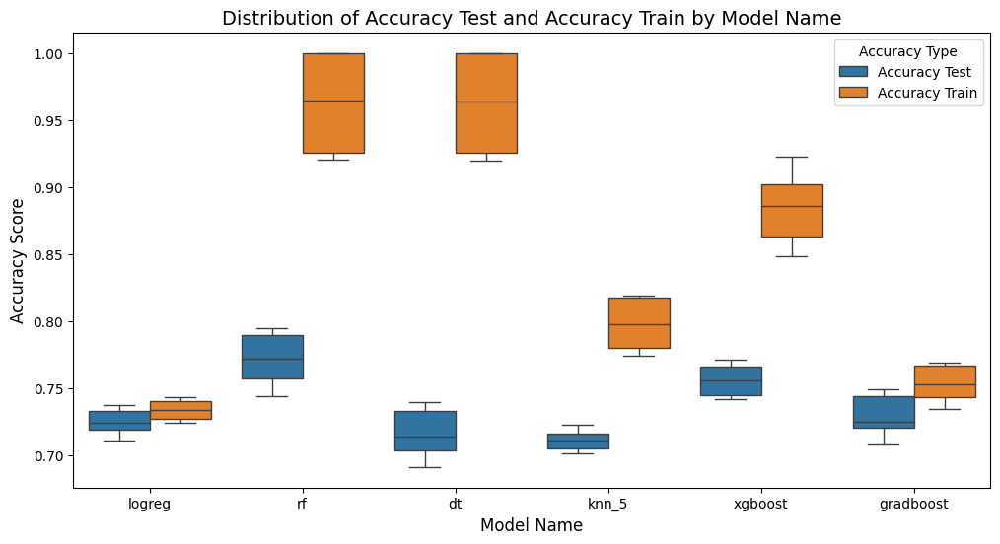

In [ ]:
df_melted = pd.melt(results_df, id_vars=['Model Name'], value_vars=['Accuracy Test', 'Accuracy Train'],
                    var_name='Accuracy Type', value_name='Accuracy Score')

plt.figure(figsize=(12, 6))
sns.boxplot(x='Model Name', y='Accuracy Score', hue='Accuracy Type', data=df_melted)

plt.title('Distribution of Accuracy Test and Accuracy Train by Model Name', fontsize=14)
plt.xlabel('Model Name', fontsize=12)
plt.ylabel('Accuracy Score', fontsize=12)

## SVC


In [ ]:
# we will tune with Rus , log , standard , pca

In [ ]:
def log_transform(df_train,df_test,constant=1):
    df_train = np.log(df_train + constant)
    df_test = np.log(df_test + constant)
    return df_train , df_test

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

In [ ]:
# resampling
undersampler = RandomUnderSampler()
X_train_res, y_train_res= undersampler.fit_resample(X_train, y_train)

# transformation
X_train_trans, X_test_trans =log_transform(X_train_res , X_test ,1)

#scaling
scaler = StandardScaler()
X_train_scal = scaler.fit_transform(X_train_trans)
X_test_scal = scaler.transform(X_test_trans)


# reduction
pca=PCA(n_components=21)
X_train_red=pca.fit_transform(X_train_scal)
X_test_red=pca.transform(X_test_scal)

In [ ]:
f1_score_train=[]
f1_score_test=[]

CC = np.linspace(0.5,10,10)
GG = np.linspace(0.001,1,10)

for i, j in zip(CC, GG):
    clf = SVC(random_state=42,C=i ,gamma=j)
    clf.fit(X_train_red, y_train_res)

    y_pred_train= clf.predict(X_train_red)
    y_pred_test= clf.predict(X_test_red)

    f1_score_train.append(f1_score(y_train_res, y_pred_train, average='weighted'))

    f1_score_test.append(f1_score(y_test, y_pred_test, average='weighted'))
    print('  I am Still not Dead ')

In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=CC, y=f1_score_test,
                    mode='lines',
                    name='f1_score_test'))
fig.add_trace(go.Scatter(x=CC, y=f1_score_train,
                    mode='lines', name='f1_score_train'))


fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=GG, y=f1_score_test,
                    mode='lines',
                    name='f1_score_test'))
fig.add_trace(go.Scatter(x=GG, y=f1_score_train,
                    mode='lines', name='f1_score_train'))


fig.show()

In [ ]:
clf = SVC(C=1.555556, gamma=0.112, random_state=42 , probability=True)
clf.fit(X_train_red, y_train_res)

SVC(C=1.555556, gamma=0.112, probability=True, random_state=42)

In [ ]:
grid_predictions_train =clf.predict(X_train_red)
grid_predictions_val =clf.predict(X_test_red)

train_probabilities = clf.predict_proba(X_train_red)[:, 1]
test_probabilities = clf.predict_proba(X_test_red)[:, 1]

# print classification report
print('####Train matrices####')
print(classification_report(y_train_res, grid_predictions_train))
print('*********************************************')
print('####Test matrices####')
print(classification_report(y_test, grid_predictions_val))
print('Test ROC AUC Score: {:.4f}'.format(roc_auc_score(y_test, test_probabilities)))

####Train matrices####
              precision    recall  f1-score   support

           0       0.94      0.85      0.89     10859
           1       0.86      0.95      0.90     10859

    accuracy                           0.90     21718
   macro avg       0.90      0.90      0.90     21718
weighted avg       0.90      0.90      0.90     21718

*********************************************
####Test matrices####
              precision    recall  f1-score   support

           0       0.86      0.69      0.77      4933
           1       0.60      0.81      0.69      2864

    accuracy                           0.73      7797
   macro avg       0.73      0.75      0.73      7797
weighted avg       0.77      0.73      0.74      7797

Test ROC AUC Score: 0.8242


In [ ]:
# # Define the parameter grid
# param_grid = {
#     'C': [0.1, 1, 10, 100, 1000],
#     'kernel': ['linear', 'rbf', 'poly'],
#     'gamma': [0.001, 0.01, 0.1, 1, 10],
#     'degree': [2, 3],
#     'coef0': [0, 0.5, 1]
# }

# # Create an SVC instance
# svc = SVC()

# # Create GridSearchCV instance with n_jobs=-1
# grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, cv=3, scoring='f1', n_jobs=-1)

# # Fit GridSearchCV
# grid_search.fit(X_train_red, y_train_res)

# # Print the best parameters and best score
# print("Best Parameters:", grid_search.best_params_)
# print("Best Score:", grid_search.best_score_)

### XGBOOST

In [ ]:
xgb_results=results_df[results_df['Model Name'] == 'xgboost']

In [ ]:
xgb_results[xgb_results['F1 Test'] == xgb_results['F1 Test'].max()]

,Sampling Method,Transformation Method,Scaling Method,Dim Reduction Method,Model Name,Accuracy Train,Accuracy Test,F1 Train,F-beta Train,F1 Test,F-beta Test,ROC AUC Train,ROC AUC Test
118,rus,none,standard,pca_21,xgboost,0.872005,0.749391,0.845366,0.947871,0.707573,0.814978,0.954266,0.832531


In [ ]:
xgb_results[xgb_results['Accuracy Test'] == xgb_results['Accuracy Test'].max()]

,Sampling Method,Transformation Method,Scaling Method,Dim Reduction Method,Model Name,Accuracy Train,Accuracy Test,F1 Train,F-beta Train,F1 Test,F-beta Test,ROC AUC Train,ROC AUC Test
58,none,log,minmax,pca_21,xgboost,0.91817,0.771194,0.887709,0.885445,0.687347,0.684909,0.973482,0.846072


In [ ]:
# resampling
undersampler = RandomUnderSampler()
X_train_res, y_train_res= undersampler.fit_resample(X_train, y_train)

# transformation
# X_train_trans, X_test_trans =log_transform(X_train_res , X_test ,1)

#scaling
scaler = StandardScaler()
X_train_scal = scaler.fit_transform(X_train_res)
X_test_scal = scaler.transform(X_test)


# reduction
pca=PCA(n_components=21)
X_train_red=pca.fit_transform(X_train_scal)
X_test_red=pca.transform(X_test_scal)

In [ ]:
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5],
    'min_child_weight': [1, 3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1, 1],
    'reg_alpha': [0, 0.1, 1]
}

# Create an XGBoost classifier instance
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

# Create GridSearchCV instance with n_jobs=-1 and f1 scoring
grid_search = GridSearchCV(estimator=xgb_clf, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train_red, y_train_res)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:16:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best Parameters: {'colsample_bytree': 0.8, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 200, 'reg_alpha': 0, 'subsample': 1.0}
Best Score: 0.7769632735462653


In [ ]:
best_xgb_model = XGBClassifier(
    colsample_bytree=0.8,
    gamma=1,
    learning_rate=0.1,
    max_depth=5,
    min_child_weight=3,
    n_estimators=200,
    reg_alpha=0,
    subsample=1.0,
    use_label_encoder=False,
    eval_metric='logloss'
)

best_xgb_model.fit(X_train_red, y_train_res)

y_test_pred = best_xgb_model.predict(X_test_red)
y_train_pred = best_xgb_model.predict(X_train_red)

# Classification report for the training data
print("Classification Report for Training Data:")
print(classification_report(y_train_res, y_train_pred))

# Classification report for the test data
print("\nClassification Report for Test Data:")
print(classification_report(y_test, y_test_pred))


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [10:43:26] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report for Training Data:
              precision    recall  f1-score   support

           0       0.89      0.77      0.83     10859
           1       0.80      0.91      0.85     10859

    accuracy                           0.84     21718
   macro avg       0.84      0.84      0.84     21718
weighted avg       0.84      0.84      0.84     21718


Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.87      0.67      0.76      4933
           1       0.60      0.83      0.70      2864

    accuracy                           0.73      7797
   macro avg       0.74      0.75      0.73      7797
weighted avg       0.77      0.73      0.74      7797



In [ ]:
# Define the model
best_xgb_model = XGBClassifier(
    colsample_bytree=0.8,
    gamma=1,
    learning_rate=0.1,
    max_depth=5,
    min_child_weight=3,
    n_estimators=200,
    reg_alpha=0,
    subsample=1.0,
    use_label_encoder=False,
    eval_metric='logloss'
)

# Fit the model
best_xgb_model.fit(X_train_red, y_train_res)

# Predictions
y_train_pred = best_xgb_model.predict(X_train_red)
y_test_pred = best_xgb_model.predict(X_test_red)

# Predicted probabilities for ROC AUC calculation
train_probabilities = best_xgb_model.predict_proba(X_train_red)[:, 1]
test_probabilities = best_xgb_model.predict_proba(X_test_red)[:, 1]

# Classification report and ROC AUC for training data
print("Classification Report for Training Data:")
print(classification_report(y_train_res, y_train_pred))
print('Train ROC AUC Score: {:.4f}'.format(roc_auc_score(y_train_res, train_probabilities)))

print("\n*********************************************")

# Classification report and ROC AUC for test data
print("Classification Report for Test Data:")
print(classification_report(y_test, y_test_pred))
print('Test ROC AUC Score: {:.4f}'.format(roc_auc_score(y_test, test_probabilities)))


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [04:33:14] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report for Training Data:
              precision    recall  f1-score   support

           0       0.90      0.78      0.83     10859
           1       0.80      0.91      0.85     10859

    accuracy                           0.84     21718
   macro avg       0.85      0.84      0.84     21718
weighted avg       0.85      0.84      0.84     21718

Train ROC AUC Score: 0.9279

*********************************************
Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.88      0.68      0.76      4933
           1       0.60      0.84      0.70      2864

    accuracy                           0.73      7797
   macro avg       0.74      0.76      0.73      7797
weighted avg       0.78      0.73      0.74      7797

Test ROC AUC Score: 0.8305


### Random forest

In [ ]:
rf_results=results_df[results_df['Model Name'] == 'rf']

In [ ]:
rf_results[rf_results['F1 Test'] == rf_results['F1 Test'].max()]

,Sampling Method,Transformation Method,Scaling Method,Dim Reduction Method,Model Name,Accuracy Train,Accuracy Test,F1 Train,F-beta Train,F1 Test,F-beta Test,ROC AUC Train,ROC AUC Test
211,rus,yeo_johnson,robust,pca_21,rf,0.926211,0.76491,0.908285,0.992292,0.726295,0.838254,0.997301,0.865688


In [ ]:
rf_results[rf_results['Accuracy Test'] == rf_results['Accuracy Test'].max()]

,Sampling Method,Transformation Method,Scaling Method,Dim Reduction Method,Model Name,Accuracy Train,Accuracy Test,F1 Train,F-beta Train,F1 Test,F-beta Test,ROC AUC Train,ROC AUC Test
25,none,none,robust,none,rf,1.0,0.794793,1.0,1.0,0.717813,0.711099,1.0,0.87854


In [ ]:
# resampling
undersampler = RandomUnderSampler()
X_train_res, y_train_res= undersampler.fit_resample(X_train, y_train)

#transformation
transformer =YeoJohnsonTransformer(standardize=True)
X_train_trans = transformer.fit_transform(X_train_res)
X_test_trans = transformer.transform(X_test)

#scaling
scaler = StandardScaler()
X_train_scal = scaler.fit_transform(X_train_trans)
X_test_scal = scaler.transform(X_test_trans)


# reduction
pca=PCA(n_components=21)
X_train_red=pca.fit_transform(X_train_scal)
X_test_red=pca.transform(X_test_scal)

In [ ]:
# Define the parameter grid
param_grid = {
    'n_estimators': [100, 300],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True, False]
}

# Create RandomForestClassifier instance
rf_clf = RandomForestClassifier(random_state=42)

# Create GridSearchCV instance with n_jobs=-1 and f1 scoring
grid_search = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train_red, y_train_res)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

Best Parameters: {'bootstrap': False, 'max_depth': 15, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}
Best Score: 0.7939218873984426


In [ ]:
best_rf_model = RandomForestClassifier(
    bootstrap=False,
    max_depth=15,
    max_features='sqrt',
    min_samples_leaf=2,
    min_samples_split=2,
    n_estimators=300,
    random_state=42
)

best_rf_model.fit(X_train_red, y_train_res)

y_test_pred = best_rf_model.predict(X_test_red)
y_train_pred = best_rf_model.predict(X_train_red)

# Classification report for the training data
print("Classification Report for Training Data:")
print(classification_report(y_train_res, y_train_pred))

# Classification report for the test data
print("\nClassification Report for Test Data:")
print(classification_report(y_test, y_test_pred))


Classification Report for Training Data:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98     10859
           1       0.97      1.00      0.99     10859

    accuracy                           0.98     21718
   macro avg       0.99      0.98      0.98     21718
weighted avg       0.99      0.98      0.98     21718


Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.89      0.69      0.78      4933
           1       0.62      0.86      0.72      2864

    accuracy                           0.75      7797
   macro avg       0.75      0.77      0.75      7797
weighted avg       0.79      0.75      0.76      7797



In [ ]:
best_rf_model = RandomForestClassifier(
    bootstrap=False,
    max_depth=15,
    max_features='sqrt',
    min_samples_leaf=2,
    min_samples_split=2,
    n_estimators=300,
    random_state=42
)

# Fit the model
best_rf_model.fit(X_train_red, y_train_res)

# Predictions
y_train_pred = best_rf_model.predict(X_train_red)
y_test_pred = best_rf_model.predict(X_test_red)

# Predicted probabilities for ROC AUC calculation
train_probabilities = best_rf_model.predict_proba(X_train_red)[:, 1]
test_probabilities = best_rf_model.predict_proba(X_test_red)[:, 1]

# Classification report and ROC AUC for training data
print("Classification Report for Training Data:")
print(classification_report(y_train_res, y_train_pred))
print('Train ROC AUC Score: {:.4f}'.format(roc_auc_score(y_train_res, train_probabilities)))

print("\n*********************************************")

# Classification report and ROC AUC for test data
print("Classification Report for Test Data:")
print(classification_report(y_test, y_test_pred))
print('Test ROC AUC Score: {:.4f}'.format(roc_auc_score(y_test, test_probabilities)))

Classification Report for Training Data:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     10859
           1       0.98      1.00      0.99     10859

    accuracy                           0.99     21718
   macro avg       0.99      0.99      0.99     21718
weighted avg       0.99      0.99      0.99     21718

Train ROC AUC Score: 0.9997

*********************************************
Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.89      0.69      0.78      4933
           1       0.62      0.86      0.72      2864

    accuracy                           0.75      7797
   macro avg       0.76      0.77      0.75      7797
weighted avg       0.79      0.75      0.76      7797

Test ROC AUC Score: 0.8602


In [ ]:
best_rf_model = RandomForestClassifier(
    bootstrap=False,
    max_depth=10,
    max_features='sqrt',
    min_samples_leaf=2,
    min_samples_split=2,
    n_estimators=50,
    random_state=42
)

best_rf_model.fit(X_train_red, y_train_res)

y_test_pred = best_rf_model.predict(X_test_red)
y_train_pred = best_rf_model.predict(X_train_red)

# Classification report for the training data
print("Classification Report for Training Data:")
print(classification_report(y_train_res, y_train_pred))

# Classification report for the test data
print("\nClassification Report for Test Data:")
print(classification_report(y_test, y_test_pred))

Classification Report for Training Data:
              precision    recall  f1-score   support

           0       0.94      0.76      0.84     10859
           1       0.80      0.95      0.87     10859

    accuracy                           0.86     21718
   macro avg       0.87      0.86      0.85     21718
weighted avg       0.87      0.86      0.85     21718


Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.89      0.64      0.75      4933
           1       0.58      0.86      0.69      2864

    accuracy                           0.72      7797
   macro avg       0.73      0.75      0.72      7797
weighted avg       0.77      0.72      0.73      7797



In [ ]:
best_rf_model = RandomForestClassifier(
    bootstrap=False,
    max_depth=10,
    max_features='sqrt',
    min_samples_leaf=2,
    min_samples_split=2,
    n_estimators=50,
    random_state=42
)

# Fit the model
best_rf_model.fit(X_train_red, y_train_res)

# Predictions
y_train_pred = best_rf_model.predict(X_train_red)
y_test_pred = best_rf_model.predict(X_test_red)

# Predicted probabilities for ROC AUC calculation
train_probabilities = best_rf_model.predict_proba(X_train_red)[:, 1]
test_probabilities = best_rf_model.predict_proba(X_test_red)[:, 1]

# Classification report and ROC AUC for training data
print("Classification Report for Training Data:")
print(classification_report(y_train_res, y_train_pred))
print('Train ROC AUC Score: {:.4f}'.format(roc_auc_score(y_train_res, train_probabilities)))

print("\n*********************************************")

# Classification report and ROC AUC for test data
print("Classification Report for Test Data:")
print(classification_report(y_test, y_test_pred))
print('Test ROC AUC Score: {:.4f}'.format(roc_auc_score(y_test, test_probabilities)))

Classification Report for Training Data:
              precision    recall  f1-score   support

           0       0.94      0.77      0.85     10859
           1       0.81      0.95      0.87     10859

    accuracy                           0.86     21718
   macro avg       0.87      0.86      0.86     21718
weighted avg       0.87      0.86      0.86     21718

Train ROC AUC Score: 0.9517

*********************************************
Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.88      0.65      0.75      4933
           1       0.58      0.85      0.69      2864

    accuracy                           0.72      7797
   macro avg       0.73      0.75      0.72      7797
weighted avg       0.77      0.72      0.73      7797

Test ROC AUC Score: 0.8277


# another Approach

In [ ]:
df = pd.read_csv('train_dataset.csv')

In [ ]:
target='smoking'

In [ ]:
# 1. BMI Calculation
df['BMI'] = df['weight(kg)'] / ((df['height(cm)'] / 100) ** 2)

# 2. Blood Pressure Ratio
df['blood_pressure_ratio'] = df['systolic'] / df['relaxation']

# 3. Total Cholesterol Calculation
df['total_cholesterol'] = df['HDL'] + df['LDL'] + (df['triglyceride'] / 0.2)

# 4. Creatinine Clearance
df['creatinine_clearance'] = ((140 - df['age']) * df['weight(kg)']) / (72 * df['serum creatinine'])

# 5. Average Eyesight
df['average_eyesight'] = (df['eyesight(right)'] + df['eyesight(left)']) / 2

# 5. Average hearing
df['average_hearing'] = (df['hearing(right)'] + df['hearing(left)']) / 2

In [ ]:
# columns_to_drop = ['weight(kg)', 'triglyceride', 'eyesight(right)', 'eyesight(left)', 'hearing(right)' ,'hearing(left)']
# df_train_reduced = df.drop(columns=columns_to_drop)

In [ ]:
X = df.drop(target, axis=1)
y = df[target]

In [ ]:
y_label0=y[y==0]
len(y_label0)

24666

In [ ]:
y_label1=y[y==1]
len(y_label1)

14318

In [ ]:
from sklearn.model_selection import StratifiedKFold

In [ ]:
sss = StratifiedKFold(n_splits=5, random_state=None, shuffle=False)

for train_index, test_index in sss.split(X, y):
    original_Xtrain, original_Xtest = X.iloc[train_index], X.iloc[test_index]
    original_ytrain, original_ytest = y.iloc[train_index], y.iloc[test_index]

original_Xtrain = original_Xtrain.values
original_Xtest = original_Xtest.values
original_ytrain = original_ytrain.values
original_ytest = original_ytest.values

train_unique_label, train_counts_label = np.unique(original_ytrain, return_counts=True)
test_unique_label, test_counts_label = np.unique(original_ytest, return_counts=True)

print('Label Distributions: \n')
print(train_counts_label/ len(original_ytrain))
print(test_counts_label/ len(original_ytest))

Label Distributions: 

[0.6327113 0.3672887]
[0.63276039 0.36723961]


In [ ]:
df = df.sample(frac=1)

# amount of smoking  14318 rows.
smoking_df = df.loc[df[target] == 1]
non_smoking_df = df.loc[df[target] == 0][:14318]

normal_distributed_df = pd.concat([smoking_df, non_smoking_df])

# Shuffle dataframe rows
new_df = normal_distributed_df.sample(frac=1, random_state=42)

new_df.head(20)

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,ALT,Gtp,dental caries,smoking,BMI,blood_pressure_ratio,total_cholesterol,creatinine_clearance,average_eyesight,average_hearing
25237,55,165,60,84.0,1.0,1.0,1,1,104,60,...,17,553,0,1,22.038567,1.733333,1240.0,88.541667,1.00,1.0
28524,55,160,65,85.0,0.8,0.9,1,1,109,60,...,23,136,0,1,25.390625,1.816667,1233.0,95.920139,0.85,1.0
24419,40,165,50,68.0,0.7,0.9,1,1,104,62,...,13,15,0,0,18.365473,1.677419,799.0,86.805556,0.80,1.0
5247,40,160,60,71.0,0.8,1.0,1,1,117,79,...,14,15,0,0,23.437500,1.481013,499.0,104.166667,0.90,1.0
31023,45,145,50,73.0,1.0,1.0,1,1,122,76,...,22,13,0,0,23.781213,1.605263,516.0,94.246032,1.00,1.0
30833,45,170,80,92.0,0.8,1.2,1,1,150,100,...,32,24,0,0,27.681661,1.500000,708.0,95.959596,1.00,1.0
11328,25,165,60,73.0,1.2,1.5,1,1,94,58,...,21,22,0,1,22.038567,1.620690,1108.0,87.121212,1.35,1.0
23047,50,165,65,82.0,1.0,1.0,1,1,110,65,...,14,16,0,0,23.875115,1.692308,817.0,101.562500,1.00,1.0
33563,40,155,50,67.0,1.0,1.0,1,1,122,83,...,12,14,0,0,20.811655,1.469880,747.0,99.206349,1.00,1.0
16553,30,170,60,77.3,1.0,1.2,1,2,117,75,...,27,19,0,0,20.761246,1.560000,1046.0,101.851852,1.10,1.5


Distribution of the Classes in the subsample dataset
smoking
1    0.5
0    0.5
Name: count, dtype: float64


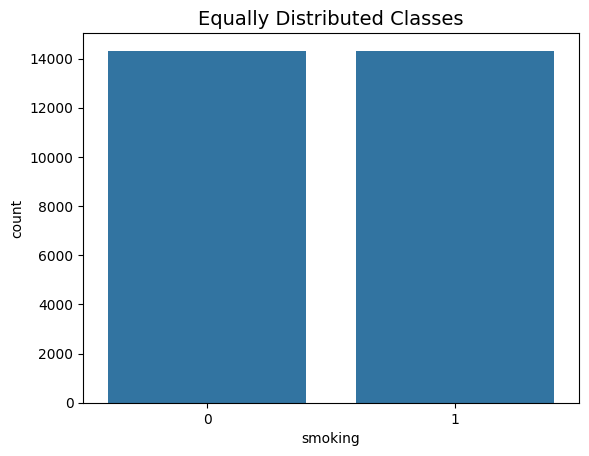

In [ ]:
print('Distribution of the Classes in the subsample dataset')
print(new_df[target].value_counts()/len(new_df))

sns.countplot(x=target, data=new_df)
plt.title('Equally Distributed Classes', fontsize=14)
plt.show()

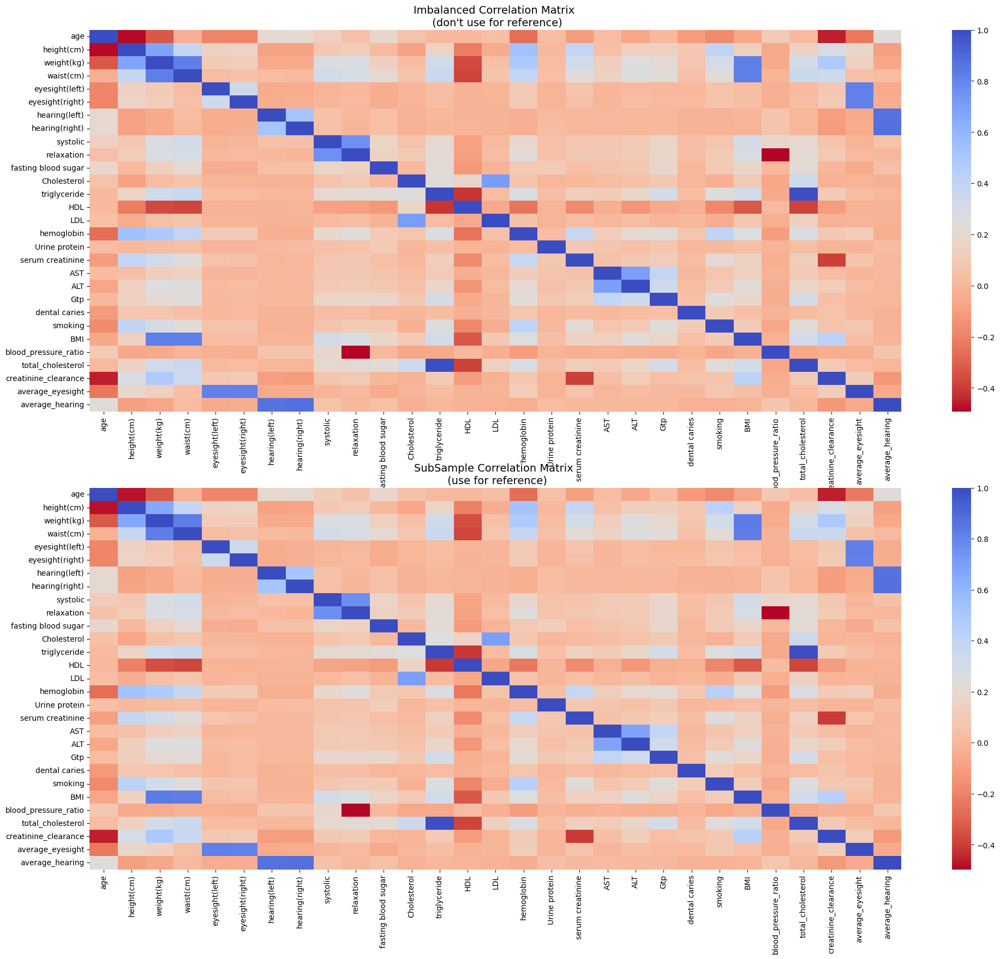

In [ ]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(24,20))

# Entire DataFrame
corr = df.corr()
sns.heatmap(corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax1)
ax1.set_title("Imbalanced Correlation Matrix \n (don't use for reference)", fontsize=14)


sub_sample_corr = new_df.corr()
sns.heatmap(sub_sample_corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax2)
ax2.set_title('SubSample Correlation Matrix \n (use for reference)', fontsize=14)
plt.show()

In [ ]:
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD

In [ ]:
X = new_df.drop(target, axis=1)
y = new_df[target]


# T-SNE Implementation
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(X.values)

# PCA Implementation
X_reduced_pca = PCA(n_components=2, random_state=42).fit_transform(X.values)

# TruncatedSVD
X_reduced_svd = TruncatedSVD(n_components=2, algorithm='randomized', random_state=42).fit_transform(X.values)


In [ ]:
import matplotlib.patches as mpatches

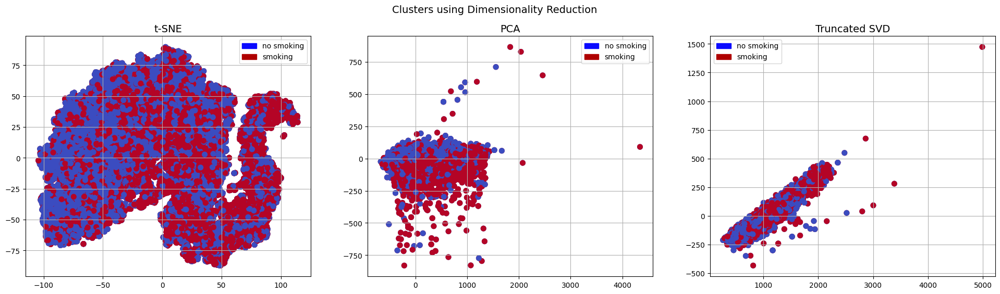

In [ ]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24,6))

f.suptitle('Clusters using Dimensionality Reduction', fontsize=14)


blue_patch = mpatches.Patch(color='#0A0AFF', label='no smoking')
red_patch = mpatches.Patch(color='#AF0000', label='smoking')


# t-SNE scatter plot
ax1.scatter(X_reduced_tsne[:,0], X_reduced_tsne[:,1], c=(y == 0), cmap='coolwarm', label='no smoking', linewidths=2)
ax1.scatter(X_reduced_tsne[:,0], X_reduced_tsne[:,1], c=(y == 1), cmap='coolwarm', label='smoking', linewidths=2)
ax1.set_title('t-SNE', fontsize=14)

ax1.grid(True)

ax1.legend(handles=[blue_patch, red_patch])


# PCA scatter plot
ax2.scatter(X_reduced_pca[:,0], X_reduced_pca[:,1], c=(y == 0), cmap='coolwarm', label='no smoking', linewidths=2)
ax2.scatter(X_reduced_pca[:,0], X_reduced_pca[:,1], c=(y == 1), cmap='coolwarm', label='smoking', linewidths=2)
ax2.set_title('PCA', fontsize=14)

ax2.grid(True)

ax2.legend(handles=[blue_patch, red_patch])

# TruncatedSVD scatter plot
ax3.scatter(X_reduced_svd[:,0], X_reduced_svd[:,1], c=(y == 0), cmap='coolwarm', label='no smoking', linewidths=2)
ax3.scatter(X_reduced_svd[:,0], X_reduced_svd[:,1], c=(y == 1), cmap='coolwarm', label='smoking', linewidths=2)
ax3.set_title('Truncated SVD', fontsize=14)

ax3.grid(True)

ax3.legend(handles=[blue_patch, red_patch])

plt.show()

## Split the data

In [ ]:
X=df.drop(columns=[target] )
y= df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42 ,stratify=y)

### Outlier

In [ ]:
from scipy.stats import zscore, median_abs_deviation

In [ ]:
def total_outliers_z_score(df, threshold=3):
    # Create a boolean Series to track rows with outliers
    outlier_rows = pd.Series(False, index=df.index)

    for column in df.select_dtypes(include=[np.number]).columns:
        # Calculate Z-scores
        df['z_score'] = zscore(df[column])

        # Identify outliers
        outliers = np.abs(df['z_score']) > threshold

        # Update the outlier_rows boolean Series
        outlier_rows = outlier_rows | outliers

    # Drop the last created column
    df.drop(['z_score'], axis=1, inplace=True)

    # Get the indexes of the outlier rows
    outlier_indexes = df.index[outlier_rows]

    # Total number of unique rows with at least one outlier
    total_outliers = outlier_rows.sum()

    return total_outliers, outlier_indexes


def total_outliers_modified_z_score(df, threshold=3.5):
    # Create a boolean Series to track rows with outliers
    outlier_rows = pd.Series(False, index=df.index)

    for column in df.select_dtypes(include=[np.number]).columns:
        # Calculate Median Absolute Deviation (MAD)
        mad = median_abs_deviation(df[column])
        median = df[column].median()

        # Calculate Modified Z-scores
        df['mod_z_score'] = 0.6745 * (df[column] - median) / mad

        # Identify outliers
        outliers = np.abs(df['mod_z_score']) > threshold

        # Update the outlier_rows boolean Series
        outlier_rows = outlier_rows | outliers

    # drop the last created col
    df.drop(['mod_z_score'], axis=1, inplace=True)

    # Get the indexes of the outlier rows
    outlier_indexes = df.index[outlier_rows]

    # Total number of unique rows with at least one outlier
    total_outliers = outlier_rows.sum()

    return total_outliers, outlier_indexes


def total_outliers_iqr(df, outlier_threshold=1.5):
    # Create a boolean Series to track rows with outliers
    outlier_rows = pd.Series(False, index=df.index)

    for column in df.select_dtypes(include=[np.number]).columns:
        # Calculate Q1, Q3, and IQR
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        # Define outlier bounds
        lower_bound = Q1 - outlier_threshold * IQR
        upper_bound = Q3 + outlier_threshold * IQR

        # Identify outliers
        outliers = (df[column] < lower_bound) | (df[column] > upper_bound)

        # Update the outlier_rows boolean Series
        outlier_rows = outlier_rows | outliers

    # Get the indexes of the outlier rows
    outlier_indexes = df.index[outlier_rows]

    # Total number of unique rows with at least one outlier
    total_outliers = outlier_rows.sum()

    return total_outliers, outlier_indexes


In [ ]:
total_outliers_z , outlier_indexes_z = total_outliers_z_score(X_train)
print(f"Total number of rows with outliers using Z-score: {total_outliers_z}    &&& Percentage : ", total_outliers_z / X_train.shape[0])


total_outliers_mod_z, outlier_indexes_mod_z = total_outliers_modified_z_score(X_train)
print(f"Total number of rows with outliers using Modified Z-score: {total_outliers_mod_z}   &&& Percentage : ", total_outliers_mod_z / X_train.shape[0])

total_outliers_iqr, outlier_indexes_iqr= total_outliers_iqr(X_train)
print(f"Total number of rows with outliers using IQR: {total_outliers_iqr}    &&& Percentage : ", total_outliers_iqr / X_train.shape[0])

Total number of rows with outliers using Z-score: 4919    &&& Percentage :  0.15772597556674256
Total number of rows with outliers using Modified Z-score: 13522   &&& Percentage :  0.4335780934363677
Total number of rows with outliers using IQR: 16433    &&& Percentage :  0.5269182672267291


In [ ]:
X_train= X_train.drop(outlier_indexes_z)
y_train= y_train.drop(outlier_indexes_z)


In [ ]:
X_train.head()

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,AST,ALT,Gtp,dental caries,BMI,blood_pressure_ratio,total_cholesterol,creatinine_clearance,average_eyesight,average_hearing
33012,50,175,65,76.0,0.5,1.0,1,1,120,79,...,29,21,25,0,21.224490,1.518987,485.0,81.250000,0.75,1.0
28809,60,165,55,73.0,0.8,0.7,1,1,119,79,...,45,35,19,0,20.202020,1.506329,642.0,87.301587,0.75,1.0
1926,55,150,60,84.0,1.5,1.0,1,1,107,70,...,59,89,48,1,26.666667,1.528571,629.0,64.393939,1.25,1.0
3128,45,175,80,89.5,1.2,1.2,1,1,139,85,...,19,26,29,0,26.122449,1.635294,989.0,95.959596,1.20,1.0
18879,50,155,65,81.0,0.9,0.7,1,1,113,66,...,23,17,15,0,27.055151,1.712121,594.0,90.277778,0.80,1.0


In [ ]:
y_train.head()

,smoking
33012,0
28809,0
1926,0
3128,0
18879,0


# Reducing the model Complexity

In [ ]:
def corr_methods(df,method=''):
    if method == '':
        corr_matrix= df.corr()
    elif method == 'spearman':
        corr_matrix= df.corr(method='spearman')
    elif method == 'kendall':
        corr_matrix= df.corr(method='kendall')

    # Mask the upper triangle to avoid duplicate pairs
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    upper = corr_matrix.where(mask)

    # Find the index of the maximum correlation value
    max_corr = upper.abs().unstack().sort_values(ascending=False)
    max_corr = max_corr[max_corr < 1]
    max_corr = max_corr[max_corr>0.8]

    return max_corr

In [ ]:
corr_methods(X_train)

total_cholesterol  triglyceride       0.994319
average_eyesight   eyesight(left)     0.920832
                   eyesight(right)    0.920055
LDL                Cholesterol        0.910434
waist(cm)          weight(kg)         0.816470
BMI                waist(cm)          0.804970
                   weight(kg)         0.804946
dtype: float64

In [ ]:
# non linear correlation
corr_methods(X_train,'spearman')

total_cholesterol  triglyceride       0.990788
average_eyesight   eyesight(left)     0.916806
                   eyesight(right)    0.915974
LDL                Cholesterol        0.903841
waist(cm)          weight(kg)         0.807811
dtype: float64

In [ ]:
corr_methods(X_train,'kendall')

total_cholesterol  triglyceride       0.922462
average_eyesight   eyesight(left)     0.821020
                   eyesight(right)    0.819325
dtype: float64

In [ ]:
X_train.columns

Index(['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)',
       'eyesight(right)', 'hearing(left)', 'hearing(right)', 'systolic',
       'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride',
       'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST',
       'ALT', 'Gtp', 'dental caries', 'BMI', 'blood_pressure_ratio',
       'total_cholesterol', 'creatinine_clearance', 'average_eyesight',
       'average_hearing'],
      dtype='object')

In [ ]:
X_train=X_train.drop(columns=['triglyceride','eyesight(right)','Cholesterol','eyesight(left)','weight(kg)' ,'waist(cm)'])
X_test=X_test.drop(columns=['triglyceride','eyesight(right)','Cholesterol','eyesight(left)','weight(kg)' ,'waist(cm)'])


In [ ]:
X_train.columns

Index(['age', 'height(cm)', 'hearing(left)', 'hearing(right)', 'systolic',
       'relaxation', 'fasting blood sugar', 'HDL', 'LDL', 'hemoglobin',
       'Urine protein', 'serum creatinine', 'AST', 'ALT', 'Gtp',
       'dental caries', 'BMI', 'blood_pressure_ratio', 'total_cholesterol',
       'creatinine_clearance', 'average_eyesight', 'average_hearing'],
      dtype='object')

##### low correlation with target

In [ ]:
y_train.shape

(26289,)

In [ ]:
X_train['hearing(left)'].value_counts()

,count
hearing(left),
1,26268


In [ ]:
threshold = 0.05
corr_pearson = X_train.corrwith(y_train).abs()
corr_spearman = X_train.corrwith(y_train, method='spearman').abs()
corr_kendall = X_train.corrwith(y_train, method='kendall').abs()

low_corr_features_pearson = corr_pearson[corr_pearson < threshold].index
low_corr_features_spearman = corr_spearman[corr_spearman < threshold].index
low_corr_features_kendall = corr_kendall[corr_kendall < threshold].index

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/pandas/core/nanops.py:1624: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  return spearmanr(a, b)[0]


In [ ]:
low_corr_features_pearson

Index(['LDL', 'Urine protein'], dtype='object')

In [ ]:
low_corr_features_spearman

Index(['LDL', 'Urine protein'], dtype='object')

In [ ]:
low_corr_features_kendall

Index(['LDL', 'Urine protein', 'blood_pressure_ratio'], dtype='object')

In [ ]:
X_train=X_train.drop(columns=[ 'LDL','Urine protein'])
X_test=X_test.drop(columns=[ 'LDL','Urine protein'])


In [ ]:
X_train=X_train.drop(columns=[ 'hearing(left)','hearing(right)'])
X_test=X_test.drop(columns=[ 'hearing(left)','hearing(right)'])

### Anova

In [ ]:
from sklearn.feature_selection import f_classif
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
f_values, p_values = f_classif(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [17] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


In [ ]:
anova_results = pd.DataFrame({
    'Feature': X_train.columns,
    'F-Value': f_values,
    'p-Value': p_values
}).sort_values(by='F-Value', ascending=False)
print(anova_results)

                 Feature      F-Value        p-Value
6             hemoglobin  5121.179157   0.000000e+00
1             height(cm)  4674.960672   0.000000e+00
10                   Gtp  2748.907229   0.000000e+00
7       serum creatinine  1947.480667   0.000000e+00
14     total_cholesterol  1524.322205  4.940656e-324
5                    HDL  1015.557609  1.089683e-218
0                    age   748.694988  1.469679e-162
9                    ALT   735.805175  7.815278e-160
11         dental caries   332.101326   9.548600e-74
16      average_eyesight   300.716454   5.434063e-67
12                   BMI   299.256913   1.120776e-66
3             relaxation   270.865099   1.478412e-60
8                    AST   171.511921   4.586006e-39
2               systolic   149.893261   2.270097e-34
4    fasting blood sugar   141.736148   1.347356e-32
15  creatinine_clearance   137.337806   1.219656e-31
13  blood_pressure_ratio    68.713088   1.192625e-16
17       average_hearing          NaN         

In [ ]:
insignificant_features = anova_results[anova_results['p-Value'] > 0.05]['Feature']
print(insignificant_features)

Series([], Name: Feature, dtype: object)


### VIF

In [ ]:
vif_data = pd.DataFrame()
vif_data['Feature'] = X_train.columns
vif_data['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
print(vif_data)

                 Feature           VIF
0                    age      5.603612
1             height(cm)      5.661579
2               systolic    105.944336
3             relaxation    136.578501
4    fasting blood sugar      1.166267
5                    HDL      1.366742
6             hemoglobin      1.821125
7       serum creatinine     15.182412
8                    AST      2.468622
9                    ALT      3.037534
10                   Gtp      1.539665
11         dental caries      1.018145
12                   BMI      7.198543
13  blood_pressure_ratio     60.315788
14     total_cholesterol      1.421792
15  creatinine_clearance     20.722606
16      average_eyesight      1.143862
17       average_hearing  10193.080620


In [ ]:
X_train=X_train.drop(columns=[ 'average_hearing'])
X_test=X_test.drop(columns=[ 'average_hearing'])

## Modeling

### XGBOOST

In [ ]:

# transformation
# X_train_trans, X_test_trans =log_transform(X_train , X_test ,1)

#scaling
scaler = StandardScaler()
X_train_scal = scaler.fit_transform(X_train)
X_test_scal = scaler.transform(X_test)


# reduction
# pca=PCA(n_components=21)
# X_train_red=pca.fit_transform(X_train_scal)
# X_test_red=pca.transform(X_test_scal)

In [ ]:
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5],
    'min_child_weight': [1, 3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1, 1],
    'reg_alpha': [0, 0.1, 1]
}
# Create a StratifiedKFold instance
stratified_kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)


# Create an XGBoost classifier instance
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

# Create a GridSearchCV instance with StratifiedKFold
grid_search = GridSearchCV(estimator=xgb_clf, param_grid=param_grid, cv=stratified_kfold, scoring='f1', n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train_scal, y_train)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [17:35:24] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best Parameters: {'colsample_bytree': 1.0, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 200, 'reg_alpha': 0.1, 'subsample': 0.8}
Best Score: 0.6653267551253966


# Yet Another Approach

In [ ]:
df = pd.read_csv('train_dataset.csv')

In [ ]:
target='smoking'

In [ ]:
df['BMI'] = df['weight(kg)'] / ((df['height(cm)'] / 100) ** 2)
df['HW_Ratio'] = df['height(cm)'] / df['waist(cm)']
df['HA_Ratio'] = df['height(cm)'] / df['age']

df['HDL-LDL Ratio'] = df['HDL'] / df['LDL']
df["HDL-triglyceride Ratio"] = df["HDL"] / df["triglyceride"]
df["LDL-triglyceride Ratio"] = df["LDL"] / df["triglyceride"]
df["Liver Enzyme Ratio"] = df["AST"] / df["ALT"]


In [ ]:
X= df.drop(['smoking'], axis=1)
y = df['smoking']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33,stratify=y , random_state=42,  shuffle =True)

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.8/362.8 kB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 8.1 MB/s eta 0:00:00


In [ ]:
import optuna

In [ ]:
def objective(trial):
    params = {
        'n_estimators' : trial.suggest_int('n_estimators', 500, 750),
        'max_depth':  trial.suggest_int('max_depth', 3, 50),
        'min_child_weight': trial.suggest_float('min_child_weight', 2, 50),
        "learning_rate" : trial.suggest_float('learning_rate',1e-4, 0.2,log=True),
        'subsample': trial.suggest_float('subsample', 0.2, 1),
        'gamma': trial.suggest_float("gamma", 1e-4, 1.0),
        "colsample_bytree" : trial.suggest_float('colsample_bytree',0.2,1),
        "colsample_bylevel" : trial.suggest_float('colsample_bylevel',0.2,1),
        "colsample_bynode" : trial.suggest_float('colsample_bynode',0.2,1),
    }

    # Build the xgboost model
    optuna_xgbmodel = XGBClassifier(**params,random_state=42,device="gpu",eval_metric= "auc")

    # Evaluate the model
    cv = cross_val_score(optuna_xgbmodel, X, y, cv = 4, scoring='roc_auc').mean()
    return cv

# Create the Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50, timeout=5000)

[I 2024-09-13 19:22:48,825] A new study created in memory with name: no-name-2fc98e7e-1336-41c4-94db-f3e4e90c84f8
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [19:23:10] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)
[I 2024-09-13 19:23:37,628] Trial 0 finished with value: 0.8466862695958799 and parameters: {'n_estimators': 633, 'max_depth': 17, 'min_child_weight': 49.131048677302566, 'learning_rate': 0.027622925755950684, 'subsample': 0.6481993312597671, 'gamma': 0.2565903714439072, 'colsample_bytree': 0.836026078628771, 'colsample_bylevel'

In [ ]:
xgb_params = {
    'n_estimators': 727,
    'max_depth': 44,
    'min_child_weight': 42.394074475465935,
    'learning_rate': 0.018945904767046495,
    'subsample': 0.9976305222111156,
    'gamma': 0.23054785929528437,
    'colsample_bytree': 0.4156956766282452,
    'colsample_bylevel': 0.9225226228188033,
    'colsample_bynode': 0.686558727709571
}

# Initialize the model
XGBModel = XGBClassifier(**xgb_params, random_state=42, use_label_encoder=False, eval_metric='logloss')

# Fit the model
XGBModel.fit(X_train, y_train)

# Predictions
y_train_pred = XGBModel.predict(X_train)
y_test_pred = XGBModel.predict(X_test)

# Predicted probabilities for ROC AUC calculation
train_probabilities = XGBModel.predict_proba(X_train)[:, 1]
test_probabilities = XGBModel.predict_proba(X_test)[:, 1]

# Classification report and ROC AUC for training data
print("Classification Report for Training Data:")
print(classification_report(y_train, y_train_pred))
print('Train ROC AUC Score: {:.4f}'.format(roc_auc_score(y_train, train_probabilities)))

print("\n*********************************************")

# Classification report and ROC AUC for test data
print("Classification Report for Test Data:")
print(classification_report(y_test, y_test_pred))
print('Test ROC AUC Score: {:.4f}'.format(roc_auc_score(y_test, test_probabilities)))

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [04:42:40] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report for Training Data:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90     18861
           1       0.83      0.82      0.83     10859

    accuracy                           0.87     29720
   macro avg       0.87      0.86      0.86     29720
weighted avg       0.87      0.87      0.87     29720

Train ROC AUC Score: 0.9405

*********************************************
Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.82      0.82      0.82      4933
           1       0.69      0.69      0.69      2864

    accuracy                           0.77      7797
   macro avg       0.75      0.76      0.76      7797
weighted avg       0.77      0.77      0.77      7797

Test ROC AUC Score: 0.8478


In [ ]:
from lightgbm import LGBMClassifier

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
# Create an Optuna objective function
def objective(trial):
    params = {
        'n_estimators' : trial.suggest_int('n_estimators', 500, 2500),
        'max_depth' : trial.suggest_int('max_depth', 3, 50),
        'learning_rate' : trial.suggest_float('learning_rate',1e-4, 0.25, log=True),
        'min_child_weight : trial.suggest_float('min_child_weight', 0.5, 4),
        'min_child_samples' : trial.suggest_int('min_child_samples', 1, 250),
        'subsample' : trial.suggest_float('subsample', 0.2, 1),
        'subsample_freq' : trial.suggest_int('subsample_freq', 0, 5),
        'colsample_bytree' : trial.suggest_float('colsample_bytree', 0.2, 1),
        'num_leaves' : trial.suggest_int('num_leaves', 2, 128),
    }

    # Build the lgbm model
    lgbmmodel_optuna = LGBMClassifier(**params,
    )
    # Evaluate the model
    cv = cross_val_score(lgbmmodel_optuna, X, y, cv = 4, scoring='roc_auc').mean()
    return cv

# Create the Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100, timeout=2000)

In [ ]:
from lightgbm import LGBMClassifier
from sklearn.metrics import classification_report, roc_auc_score

# Define the parameters and build the LightGBM model
lgbm_params = {
    'n_estimators': 624,
    'max_depth': 46,
    'learning_rate': 0.06953273561619135,
    'min_child_weight': 2.4187716216112944,
    'min_child_samples': 230,
    'subsample': 0.9515130309407626,
    'subsample_freq': 4,
    'colsample_bytree': 0.402284262124352,
    'num_leaves': 71
}

# Initialize the model
LGBMModel = LGBMClassifier(**lgbm_params, random_state=42)

# Fit the model
LGBMModel.fit(X_train, y_train)

# Predictions
y_train_pred = LGBMModel.predict(X_train)
y_test_pred = LGBMModel.predict(X_test)

# Predicted probabilities for ROC AUC calculation
train_probabilities = LGBMModel.predict_proba(X_train)[:, 1]
test_probabilities = LGBMModel.predict_proba(X_test)[:, 1]

# Classification report and ROC AUC for training data
print("Classification Report for Training Data:")
print(classification_report(y_train, y_train_pred))
print('Train ROC AUC Score: {:.4f}'.format(roc_auc_score(y_train, train_probabilities)))

print("\n*********************************************")

# Classification report and ROC AUC for test data
print("Classification Report for Test Data:")
print(classification_report(y_test, y_test_pred))
print('Test ROC AUC Score: {:.4f}'.format(roc_auc_score(y_test, test_probabilities)))


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 10859, number of negative: 18861
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3139
[LightGBM] [Info] Number of data points in the train set: 29720, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.365377 -> initscore=-0.552102
[LightGBM] [Info] Start training from score -0.552102
Classification Report for Training Data:
              precision    recall  f1-score   support

           0       0.98      0.97      0.98     18861
           1       0.96      0.96      0.96     10859

    accuracy                           0.97     29720
   macro avg       0.97      0.97      0.97     29720
weighted avg       0.97      0.97      0.97     2